In [1]:
from hest import iter_hest, XeniumReader
from hest import h5ad_reader
from hest.h5ad_reader import *
import dask
dask.config.set({'dataframe.query-planning': False})
from pathlib import Path
import hest
print(hest.__version__)
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# check gpu cucim
import cucim
print(cucim.__version__)
from cucim import CuImage

0.0.1
23.10.00


In [2]:
spot_size = 25

To speed up Xenium reader, use module load py-nvidia-rapids  # contains cucim

It requires gpu-ada

In [3]:
#sys.path.insert(0,'/home/k/kxu/.local/lib/python3.12/site-packages')
#import sys ; sys.path.insert(0,'/home/k/kxu/.local/lib/python3.11/site-packages')

In [4]:
# check gpu
# import subprocess

# try:
#     result = subprocess.run(["nvidia-smi"], capture_output=True, text=True, check=True)
#     print(result.stdout)
# except FileNotFoundError:
#     print("nvidia-smi not found (no NVIDIA driver or GPU not available).")
# except subprocess.CalledProcessError as e:
#     print("Error running nvidia-smi:", e.stderr)

# XeniumPR1S1ROI1

In [16]:
# --- load data ---
exp_stem = Path("/project/simmons_hts/shared/20_11_2024_xenium_prime_run1/20241113__143534__SIMMONS_super_secret_prime_run1/output-XETG00283__0043739__Region_1__20241113__143611")
img_path = Path("/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/CAM006_Xenium5K_post_HnE.ome.tif")
align_csv = Path("/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/CAM006_Xenium5K_post_HnE_matrix.csv")

st = load_xenium_dataset(exp_stem, img_path, align_csv, use_dask=True, spot_size_um = spot_size)

Loading the WSI... (can be slow for large images)
Loading transcripts...
Pooling xenium transcripts in pseudo-visium spots...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Reading cells...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


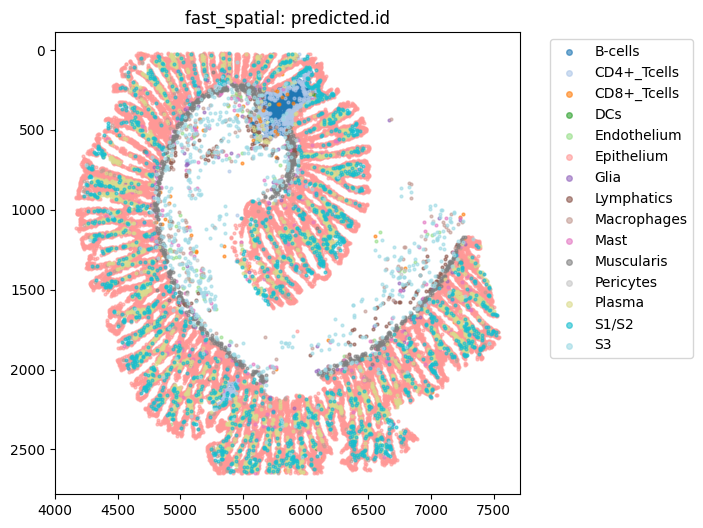

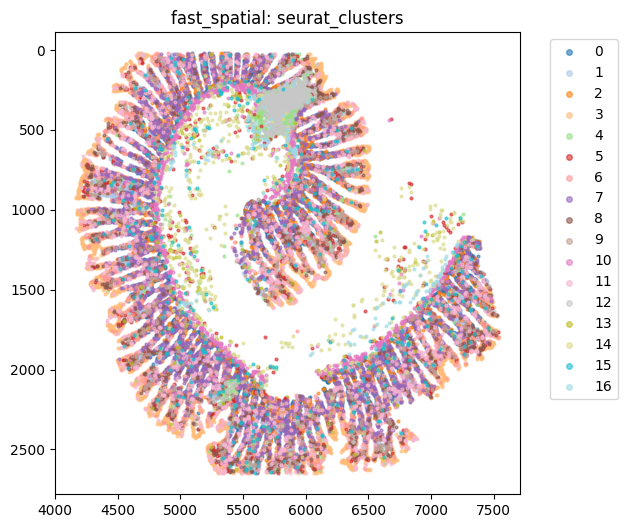

/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


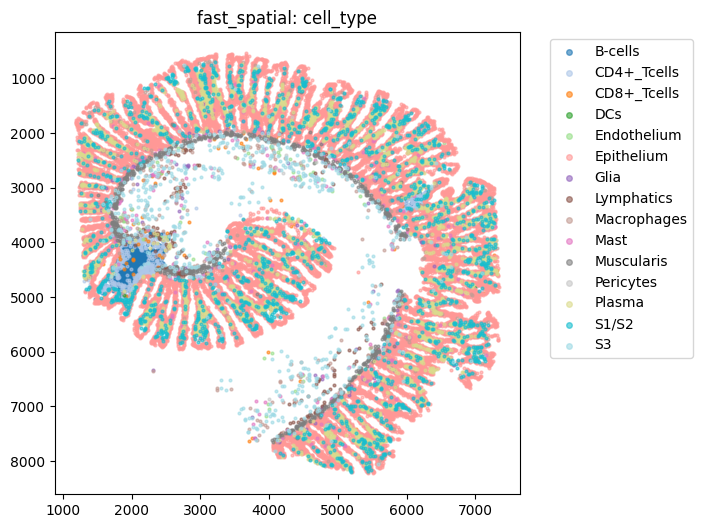

In [ ]:
# --- labelled single-cell data ---
adata_labelled = sc.read_h5ad("/project/simmons_hts/kxu/hest/xenium_labelled/h5ad/XeniumPR1S1ROI1.h5ad")

adata_labelled.obsm["spatial"] = adata_labelled.obs[["cell_centroid_x","cell_centroid_y"]].to_numpy()

fast_spatial(adata_labelled, 'predicted.id')
fast_spatial(adata_labelled, 'seurat_clusters')

# --- filter st.adata to WSI extent + drop Codeword features ---
update_st_with_filtered_and_labelled(st, adata_labelled, drop_codeword=True)

# --- align labelled cells to H&E pixel coords ---
px_um = st.meta["pixel_size"]
adata_labelled = align_labelled_to_he(adata_labelled, align_csv, pixel_size_um=px_um)

# standardize column names / annotate
adata_labelled = standardize_obs_columns(adata_labelled)
fast_spatial(adata_labelled, 'cell_type')

# --- quick sanity range of aligned coords ---
x_min, x_max, y_min, y_max = coord_range(adata_labelled.obsm["spatial"])
print(f"x:[{x_min:.1f}, {x_max:.1f}], y:[{y_min:.1f}, {y_max:.1f}]")

In [ ]:
# --- spot exclusions across full WSI ---

# get spot coords from st.adata
xy = st.adata.obsm["spatial"]
sx, sy = xy[:, 0], xy[:, 1]

# full WSI bounding box
xmin, xmax, ymin, ymax = 0, st.wsi.width, 0, st.wsi.height

# rules (edit as you like)
rules = [
    {"type": "strip", "side": "right", "size": 0.12, "units": "frac"},
    {'type':'corner', 'corner':'bottom-right', 'width':0.14, 'height':0.30, 'units':'frac'}
]

# apply rule-based exclusions directly
final_keep = apply_spot_exclusions(sx, sy, (xmin, xmax, ymin, ymax), rules)

print(f"Spots kept after rules: {final_keep.sum()} / {len(final_keep)}")

# visualize with scanpy
sc.pl.spatial(
    st.adata[final_keep],
    img_key="downscaled_fullres",
    color="total_counts",
    title="In-tissue spots (after rule exclusions)",
    size=0.25
)

Spots kept after rules: 12459 / 14545


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/tmp/ipykernel_3653531/1544950539.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


Before/After: {'old': {'num_cells': 26577, 'cells_under_tissue': 26577, 'transcripts_per_cell': 115.7133988034767, 'total_cell_area': 442995.8399666354}, 'new': {'num_cells': 26577, 'cells_under_tissue': 26577, 'transcripts_per_cell': 115.7133988034767, 'total_cell_area': 442995.8399666354}}


/home/k/kxu/.local/lib/python3.11/site-packages/hest/HESTData.py:1390: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(adata, show=False, img_key="downscaled_fullres", color=[key], title=f"in_tissue spots", return_fig=True, **pl_kwargs)


saving to pyramidal tiff... can be slow


/home/k/kxu/.local/lib/python3.11/site-packages/hest/h5ad_reader.py:319: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


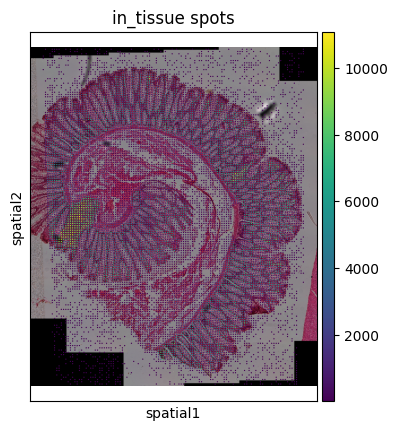

Overlay saved: /project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide1/ROI1/cell_plot.png


In [28]:
# reattach (after alignment/renames)
st.adata = st.adata[final_keep]
st.cell_adata = adata_labelled

# --- meta refresh ---
stats = refresh_meta_counts(st)
print("Before/After:", stats)

out_dir = Path("/project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide1/ROI1")
overlay_path = save_all(st, save_dir = out_dir,size=0.25)
print("Overlay saved:", overlay_path)

# XeniumPR1S1ROI2

In [13]:
# --- load data ---
exp_stem = Path("/project/simmons_hts/shared/20_11_2024_xenium_prime_run1/20241113__143534__SIMMONS_super_secret_prime_run1/output-XETG00283__0043739__Region_1__20241113__143611")
img_path = Path("/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/TIP877_Xenium5K_post_HnE.ome.tif")
align_csv = Path("/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/TIP877_Xenium5K_post_HnE_matrix.csv")

st = load_xenium_dataset(exp_stem, img_path, align_csv, use_dask=True, spot_size_um = spot_size)

Loading the WSI... (can be slow for large images)
Loading transcripts...
Pooling xenium transcripts in pseudo-visium spots...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Reading cells...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


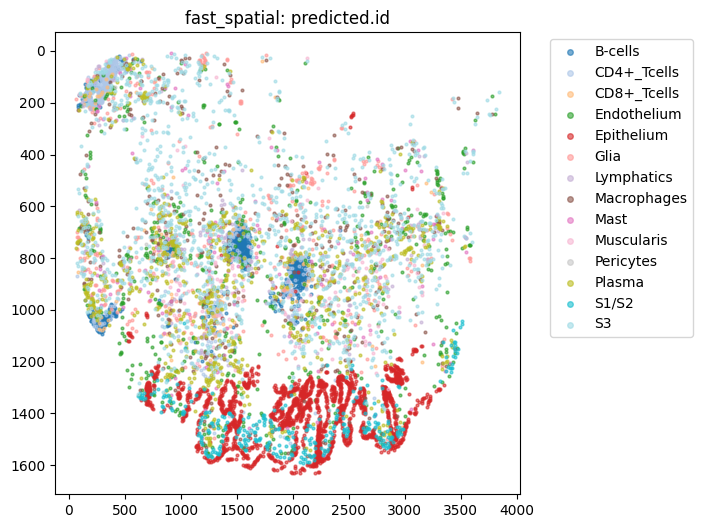

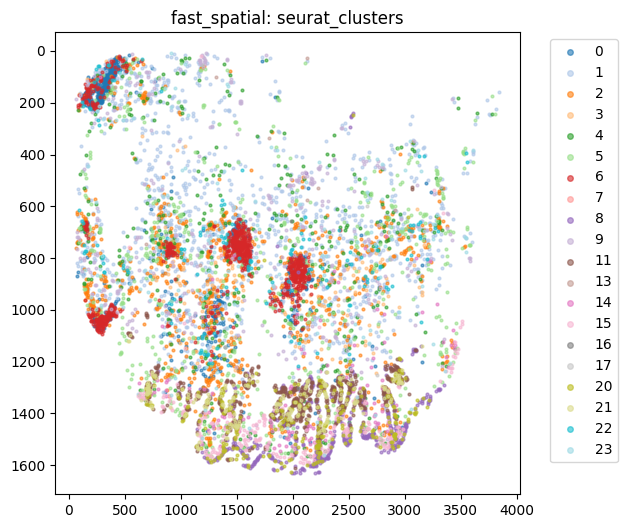

/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


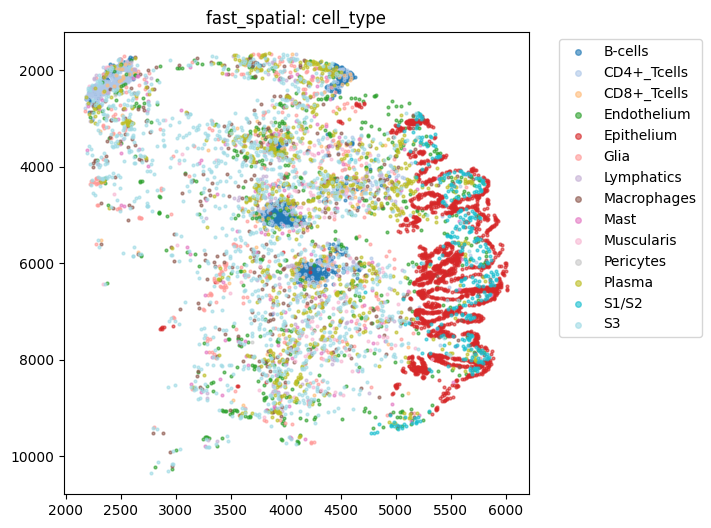

x:[2172.9, 6014.4], y:[1647.4, 10356.5]


In [14]:
# --- labelled single-cell data ---
adata_labelled = sc.read_h5ad("/project/simmons_hts/kxu/hest/xenium_labelled/h5ad/XeniumPR1S1ROI2.h5ad")

adata_labelled.obsm["spatial"] = adata_labelled.obs[["cell_centroid_x","cell_centroid_y"]].to_numpy()

fast_spatial(adata_labelled, 'predicted.id')
fast_spatial(adata_labelled, 'seurat_clusters')

# --- filter st.adata to WSI extent + drop Codeword features ---
update_st_with_filtered_and_labelled(st, adata_labelled, drop_codeword=True)

# --- align labelled cells to H&E pixel coords ---
px_um = st.meta["pixel_size"]
adata_labelled = align_labelled_to_he(adata_labelled, align_csv, pixel_size_um=px_um)

# standardize column names / annotate
adata_labelled = standardize_obs_columns(adata_labelled)
fast_spatial(adata_labelled, 'cell_type')

# --- quick sanity range of aligned coords ---
x_min, x_max, y_min, y_max = coord_range(adata_labelled.obsm["spatial"])
print(f"x:[{x_min:.1f}, {x_max:.1f}], y:[{y_min:.1f}, {y_max:.1f}]")

Before/After: {'old': {'num_cells': 1074150, 'cells_under_tissue': 1074150, 'transcripts_per_cell': 156, 'total_cell_area': 55846944.49765815}, 'new': {'num_cells': 7476, 'cells_under_tissue': 7476, 'transcripts_per_cell': 71.56861958266452, 'total_cell_area': 116343.38721884842}}


/home/k/kxu/.local/lib/python3.11/site-packages/hest/HESTData.py:1390: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(adata, show=False, img_key="downscaled_fullres", color=[key], title=f"in_tissue spots", return_fig=True, **pl_kwargs)


saving to pyramidal tiff... can be slow


/home/k/kxu/.local/lib/python3.11/site-packages/hest/h5ad_reader.py:319: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


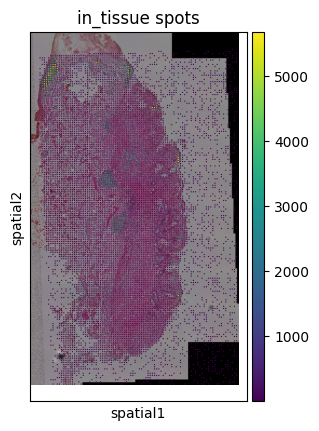

Overlay saved: /project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide1/ROI2/cell_plot.png


In [15]:
st.cell_adata = adata_labelled

# --- meta refresh ---
stats = refresh_meta_counts(st)
print("Before/After:", stats)

out_dir = Path("/project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide1/ROI2")
overlay_path = save_all(st, save_dir = out_dir,size=0.25)
print("Overlay saved:", overlay_path)

# XeniumPR1S1ROI3

In [29]:
# --- load data ---
exp_stem = Path("/project/simmons_hts/shared/20_11_2024_xenium_prime_run1/20241113__143534__SIMMONS_super_secret_prime_run1/output-XETG00283__0043739__Region_1__20241113__143611")
img_path = Path("/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/GI9389_Xenium5K_post_HnE.ome.tif")
align_csv = Path("/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/GI9389_Xenium5K_post_HnE_matrix.csv")

st = load_xenium_dataset(exp_stem, img_path, align_csv, use_dask=True, spot_size_um = spot_size)

Loading the WSI... (can be slow for large images)
Loading transcripts...
Pooling xenium transcripts in pseudo-visium spots...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Reading cells...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


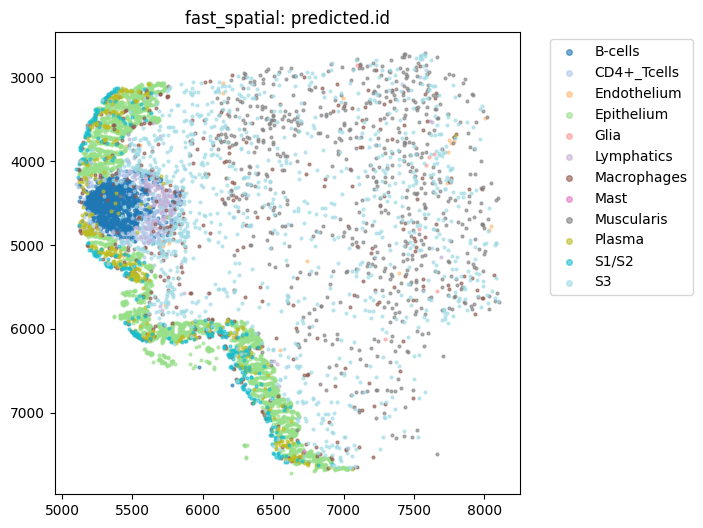

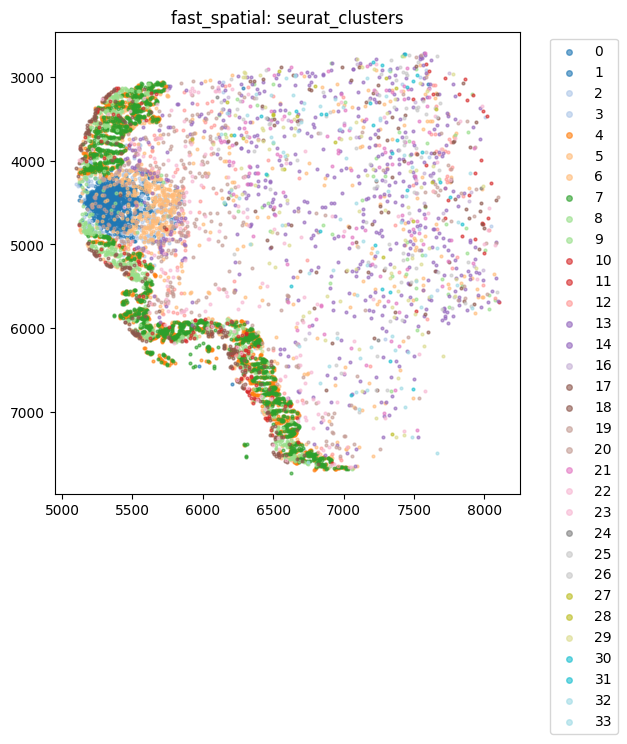

/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


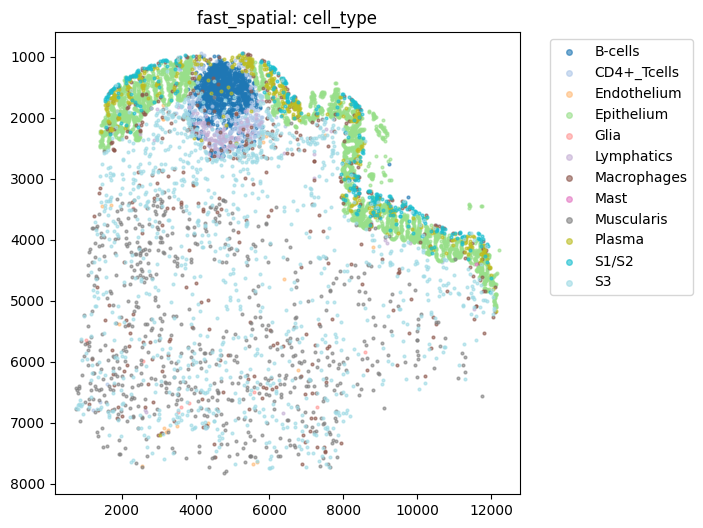

x:[760.1, 12207.8], y:[945.6, 7827.1]


In [30]:
# --- labelled single-cell data ---
adata_labelled = sc.read_h5ad("/project/simmons_hts/kxu/hest/xenium_labelled/h5ad/XeniumPR1S1ROI3.h5ad")

adata_labelled.obsm["spatial"] = adata_labelled.obs[["cell_centroid_x","cell_centroid_y"]].to_numpy()

fast_spatial(adata_labelled, 'predicted.id')
fast_spatial(adata_labelled, 'seurat_clusters')

# --- filter st.adata to WSI extent + drop Codeword features ---
update_st_with_filtered_and_labelled(st, adata_labelled, drop_codeword=True)

# --- align labelled cells to H&E pixel coords ---
px_um = st.meta["pixel_size"]
adata_labelled = align_labelled_to_he(adata_labelled, align_csv, pixel_size_um=px_um)

# standardize column names / annotate
adata_labelled = standardize_obs_columns(adata_labelled)
fast_spatial(adata_labelled, 'cell_type')

# --- quick sanity range of aligned coords ---
x_min, x_max, y_min, y_max = coord_range(adata_labelled.obsm["spatial"])
print(f"x:[{x_min:.1f}, {x_max:.1f}], y:[{y_min:.1f}, {y_max:.1f}]")

In [ ]:
# --- spot exclusions across full WSI ---

# get spot coords from st.adata
xy = st.adata.obsm["spatial"]
sx, sy = xy[:, 0], xy[:, 1]

# full WSI bounding box
xmin, xmax, ymin, ymax = 0, st.wsi.width, 0, st.wsi.height

# rules (edit as you like)
rules = [
    {'type':'corner', 'corner':'top-left', 'width':0.068, 'height':0.6, 'units':'frac'},
    {'type':'corner', 'corner':'top-right', 'width':0.07, 'height':0.38, 'units':'frac'},
    {"type": "strip", "side": "right", "size": 0.04, "units": "frac"}
]

# apply rule-based exclusions directly
final_keep = apply_spot_exclusions(sx, sy, (xmin, xmax, ymin, ymax), rules)

print(f"Spots kept after rules: {final_keep.sum()} / {len(final_keep)}")

# visualize with scanpy
sc.pl.spatial(
    st.adata[final_keep],
    img_key="downscaled_fullres",
    color="total_counts",
    title="In-tissue spots (after rule exclusions)",
    size=0.25
)

Spots kept after rules: 22646 / 24671


/tmp/ipykernel_3653531/3922182868.py:23: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


In [32]:
adata=st.adata

In [46]:
st.adata=adata

Before/After: {'old': {'num_cells': 7375, 'cells_under_tissue': 7375, 'transcripts_per_cell': 66.00881355932204, 'total_cell_area': 118138.61459176126}, 'new': {'num_cells': 7375, 'cells_under_tissue': 7375, 'transcripts_per_cell': 66.00881355932204, 'total_cell_area': 118138.61459176126}}


/home/k/kxu/.local/lib/python3.11/site-packages/hest/HESTData.py:1390: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(adata, show=False, img_key="downscaled_fullres", color=[key], title=f"in_tissue spots", return_fig=True, **pl_kwargs)


saving to pyramidal tiff... can be slow


/home/k/kxu/.local/lib/python3.11/site-packages/hest/h5ad_reader.py:319: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


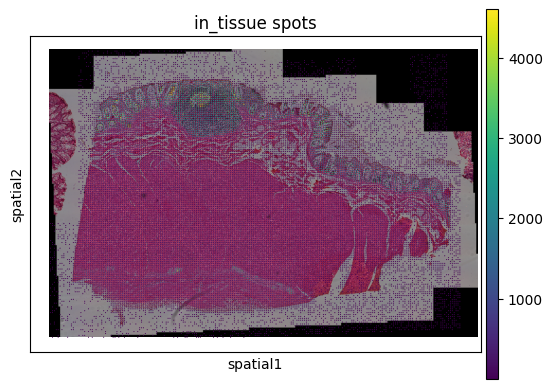

In [ ]:
# reattach (after alignment/renames)
st.adata = st.adata[final_keep]
st.cell_adata = adata_labelled

# --- meta refresh ---
stats = refresh_meta_counts(st)
print("Before/After:", stats)

out_dir = Path("/project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide1/ROI3")
overlay_path = save_all(st, save_dir = out_dir,size=0.25)
print("Overlay saved:", overlay_path)

# XeniumPR1S1ROI4

In [52]:
# --- load data ---
exp_stem = Path("/project/simmons_hts/shared/20_11_2024_xenium_prime_run1/20241113__143534__SIMMONS_super_secret_prime_run1/output-XETG00283__0043739__Region_1__20241113__143611")
img_path = Path("/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/GI9077_Xenium5K_post_HnE.ome.tif")
align_csv = Path("/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/GI9077_Xenium5K_post_HnE_matrix.csv")

st = load_xenium_dataset(exp_stem, img_path, align_csv, use_dask=True, spot_size_um = spot_size)

Loading the WSI... (can be slow for large images)
Loading transcripts...
Pooling xenium transcripts in pseudo-visium spots...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Reading cells...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


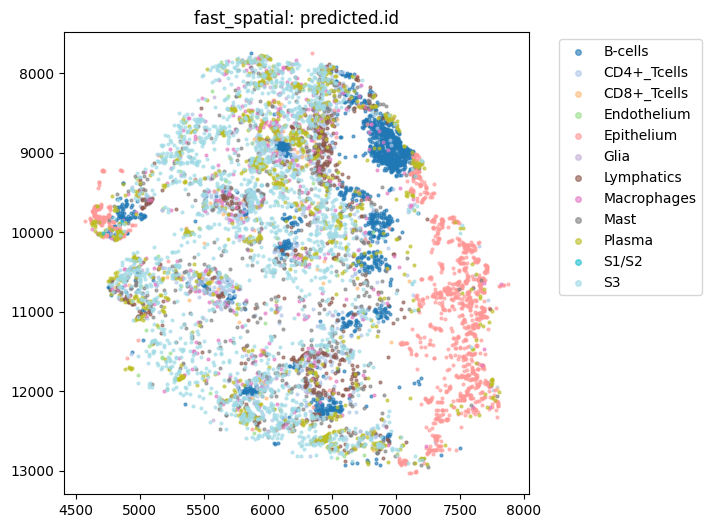

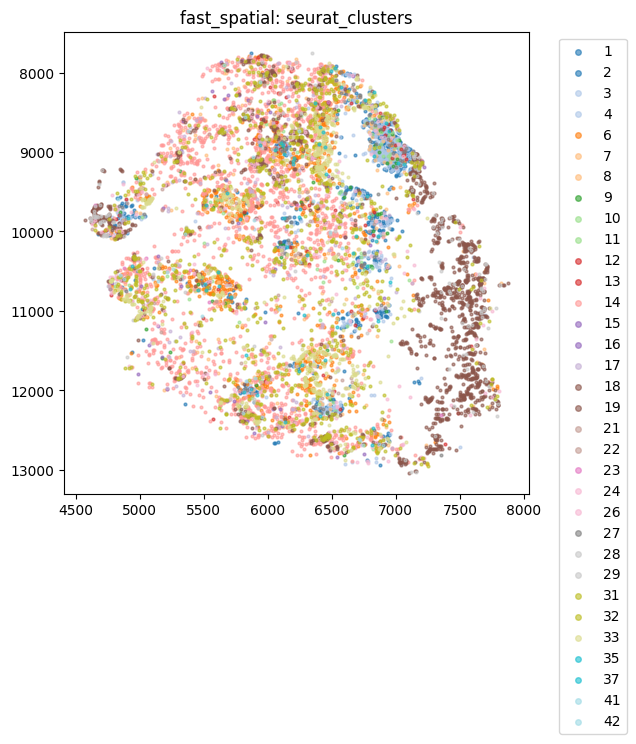

/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


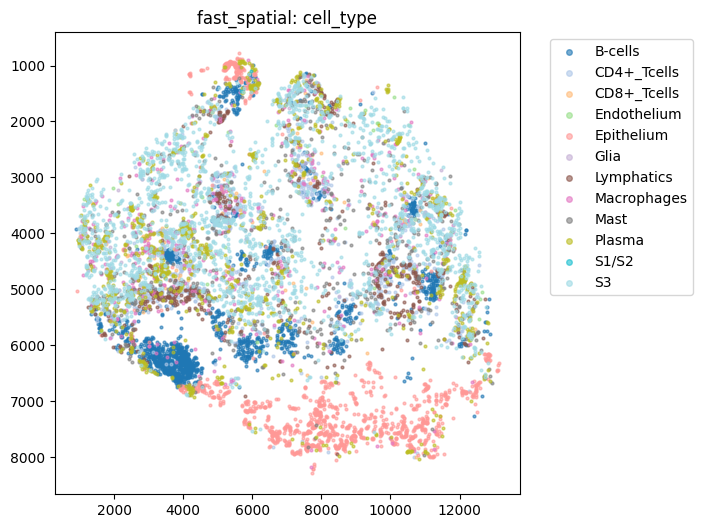

x:[898.0, 13133.0], y:[781.0, 8291.2]


In [53]:
# --- labelled single-cell data ---
adata_labelled = sc.read_h5ad("/project/simmons_hts/kxu/hest/xenium_labelled/h5ad/XeniumPR1S1ROI4.h5ad")

adata_labelled.obsm["spatial"] = adata_labelled.obs[["cell_centroid_x","cell_centroid_y"]].to_numpy()

fast_spatial(adata_labelled, 'predicted.id')
fast_spatial(adata_labelled, 'seurat_clusters')

# --- filter st.adata to WSI extent + drop Codeword features ---
update_st_with_filtered_and_labelled(st, adata_labelled, drop_codeword=True)

# --- align labelled cells to H&E pixel coords ---
px_um = st.meta["pixel_size"]
adata_labelled = align_labelled_to_he(adata_labelled, align_csv, pixel_size_um=px_um)

# standardize column names / annotate
adata_labelled = standardize_obs_columns(adata_labelled)
fast_spatial(adata_labelled, 'cell_type')

# --- quick sanity range of aligned coords ---
x_min, x_max, y_min, y_max = coord_range(adata_labelled.obsm["spatial"])
print(f"x:[{x_min:.1f}, {x_max:.1f}], y:[{y_min:.1f}, {y_max:.1f}]")

In [ ]:
# --- spot exclusions across full WSI ---

# get spot coords from st.adata
xy = st.adata.obsm["spatial"]
sx, sy = xy[:, 0], xy[:, 1]

# full WSI bounding box
xmin, xmax, ymin, ymax = 0, st.wsi.width, 0, st.wsi.height

# rules (edit as you like)
rules = [
    {'type':'corner', 'corner':'bottom-left', 'width':0.07, 'height':0.4, 'units':'frac'},
]

# apply rule-based exclusions directly
final_keep = apply_spot_exclusions(sx, sy, (xmin, xmax, ymin, ymax), rules)

print(f"Spots kept after rules: {final_keep.sum()} / {len(final_keep)}")

# visualize with scanpy
sc.pl.spatial(
    st.adata[final_keep],
    img_key="downscaled_fullres",
    color="log1p_total_counts",
    title="In-tissue spots (after rule exclusions)",
    size=0.25
)

Spots kept after rules: 28781 / 29539


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/tmp/ipykernel_3653531/3683242195.py:21: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


In [55]:
adata=st.adata

Before/After: {'old': {'num_cells': 1074150, 'cells_under_tissue': 1074150, 'transcripts_per_cell': 156, 'total_cell_area': 55846944.49765815}, 'new': {'num_cells': 8507, 'cells_under_tissue': 8507, 'transcripts_per_cell': 45.89491007405666, 'total_cell_area': 130238.31756915661}}


/home/k/kxu/.local/lib/python3.11/site-packages/hest/HESTData.py:1390: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(adata, show=False, img_key="downscaled_fullres", color=[key], title=f"in_tissue spots", return_fig=True, **pl_kwargs)


saving to pyramidal tiff... can be slow


/home/k/kxu/.local/lib/python3.11/site-packages/hest/h5ad_reader.py:319: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


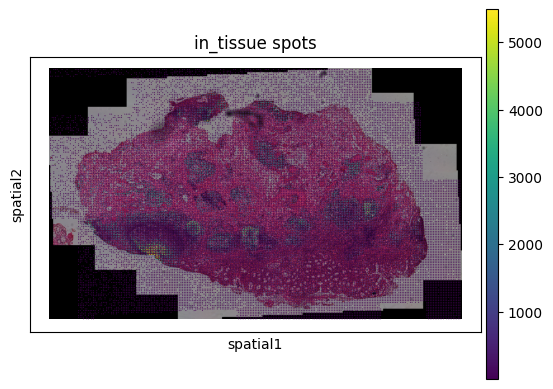

Overlay saved: /project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide1/ROI4/cell_plot.png


In [56]:
# reattach (after alignment/renames)
st.adata = st.adata[final_keep]
st.cell_adata = adata_labelled

# --- meta refresh ---
stats = refresh_meta_counts(st)
print("Before/After:", stats)

out_dir = Path("/project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide1/ROI4")
overlay_path = save_all(st, save_dir = out_dir,size=0.25)
print("Overlay saved:", overlay_path)

# XeniumPR1S1ROI5

In [57]:
# --- load data ---
exp_stem = Path("/project/simmons_hts/shared/20_11_2024_xenium_prime_run1/20241113__143534__SIMMONS_super_secret_prime_run1/output-XETG00283__0043739__Region_1__20241113__143611")
img_path = Path("/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/GI9612_Xenium5K_post_HnE.ome.tif")
align_csv = Path("/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/GI9612_Xenium5K_post_HnE_matrix.csv")

st = load_xenium_dataset(exp_stem, img_path, align_csv, use_dask=True, spot_size_um = spot_size)

Loading the WSI... (can be slow for large images)
Loading transcripts...
Pooling xenium transcripts in pseudo-visium spots...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Reading cells...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


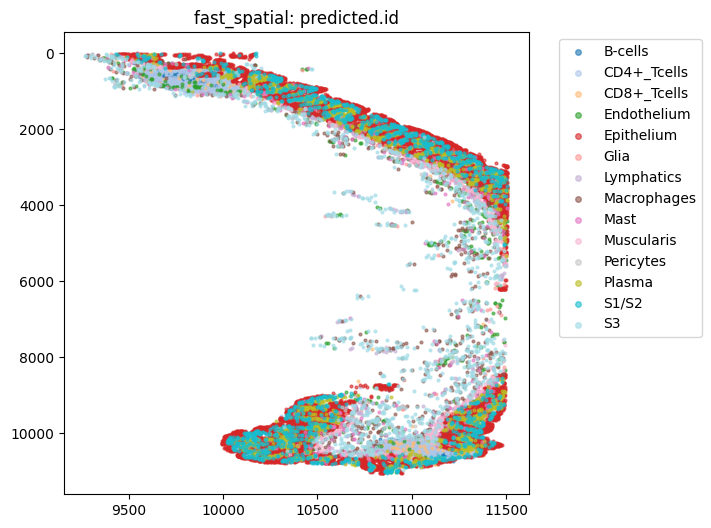

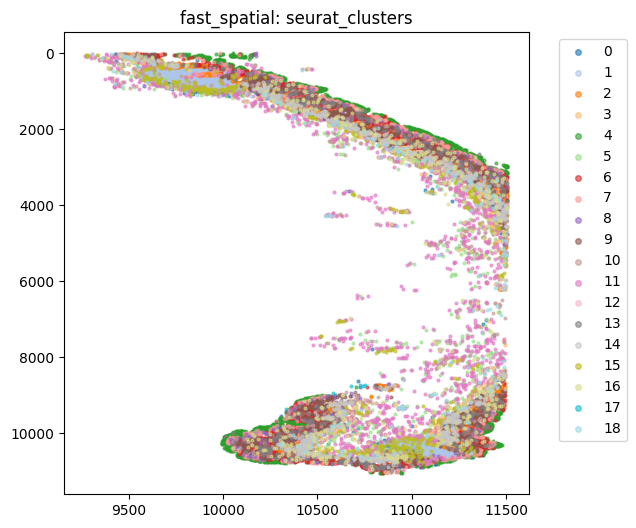

/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


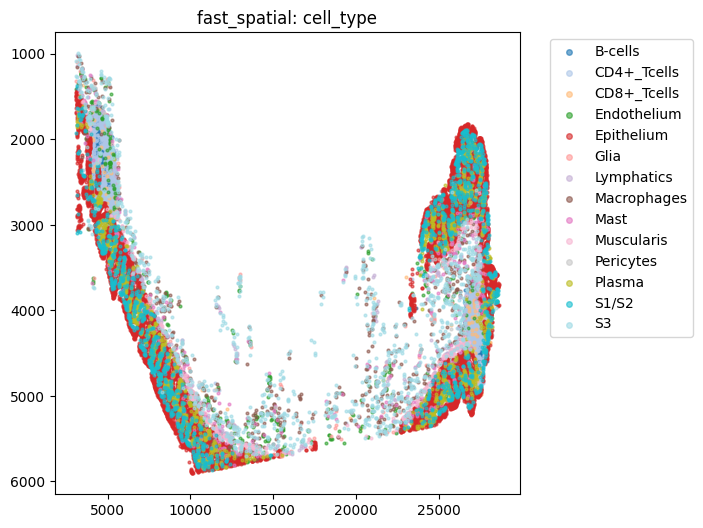

x:[3086.3, 28621.2], y:[992.3, 5904.2]


In [58]:
# --- labelled single-cell data ---
adata_labelled = sc.read_h5ad("/project/simmons_hts/kxu/hest/xenium_labelled/h5ad/XeniumPR1S1ROI5.h5ad")

adata_labelled.obsm["spatial"] = adata_labelled.obs[["cell_centroid_x","cell_centroid_y"]].to_numpy()

fast_spatial(adata_labelled, 'predicted.id')
fast_spatial(adata_labelled, 'seurat_clusters')

# --- filter st.adata to WSI extent + drop Codeword features ---
update_st_with_filtered_and_labelled(st, adata_labelled, drop_codeword=True)

# --- align labelled cells to H&E pixel coords ---
px_um = st.meta["pixel_size"]
adata_labelled = align_labelled_to_he(adata_labelled, align_csv, pixel_size_um=px_um)

# standardize column names / annotate
adata_labelled = standardize_obs_columns(adata_labelled)
fast_spatial(adata_labelled, 'cell_type')

# --- quick sanity range of aligned coords ---
x_min, x_max, y_min, y_max = coord_range(adata_labelled.obsm["spatial"])
print(f"x:[{x_min:.1f}, {x_max:.1f}], y:[{y_min:.1f}, {y_max:.1f}]")

Before/After: {'old': {'num_cells': 1074150, 'cells_under_tissue': 1074150, 'transcripts_per_cell': 156, 'total_cell_area': 55846944.49765815}, 'new': {'num_cells': 21691, 'cells_under_tissue': 21691, 'transcripts_per_cell': 137.38522889677748, 'total_cell_area': 366730.7105503036}}


/home/k/kxu/.local/lib/python3.11/site-packages/hest/HESTData.py:1390: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(adata, show=False, img_key="downscaled_fullres", color=[key], title=f"in_tissue spots", return_fig=True, **pl_kwargs)


saving to pyramidal tiff... can be slow


/home/k/kxu/.local/lib/python3.11/site-packages/hest/h5ad_reader.py:319: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


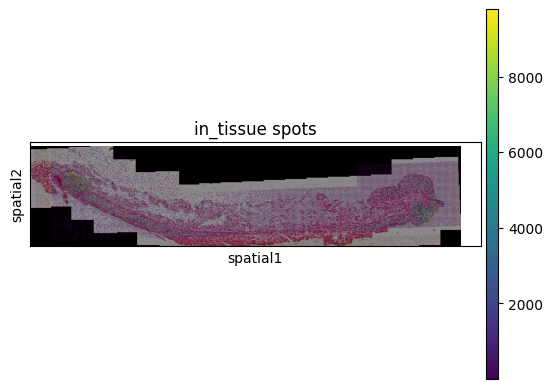

Overlay saved: /project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide1/ROI5/cell_plot.png


In [59]:
# reattach (after alignment/renames)
st.cell_adata = adata_labelled

# --- meta refresh ---
stats = refresh_meta_counts(st)
print("Before/After:", stats)

out_dir = Path("/project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide1/ROI5")
overlay_path = save_all(st, save_dir = out_dir,size=0.25)
print("Overlay saved:", overlay_path)

# XeniumPR1S1ROI6

In [4]:
# --- load data ---
exp_stem = Path("/project/simmons_hts/shared/20_11_2024_xenium_prime_run1/20241113__143534__SIMMONS_super_secret_prime_run1/output-XETG00283__0043739__Region_1__20241113__143611")
img_path = Path("/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/TIP1071_Xenium5K_post_HnE.ome.tif")
align_csv = Path("/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/TIP1071_Xenium5K_post_HnE_matrix.csv")

st = load_xenium_dataset(exp_stem, img_path, align_csv, use_dask=True, spot_size_um = spot_size)

Loading the WSI... (can be slow for large images)
Loading transcripts...
Pooling xenium transcripts in pseudo-visium spots...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Reading cells...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


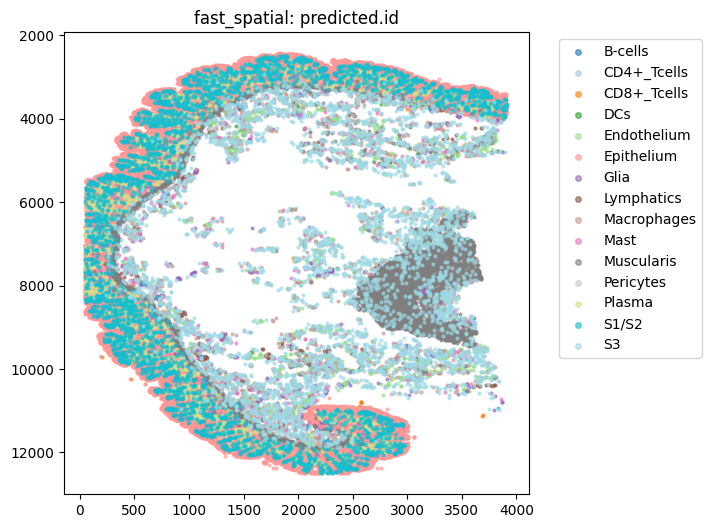

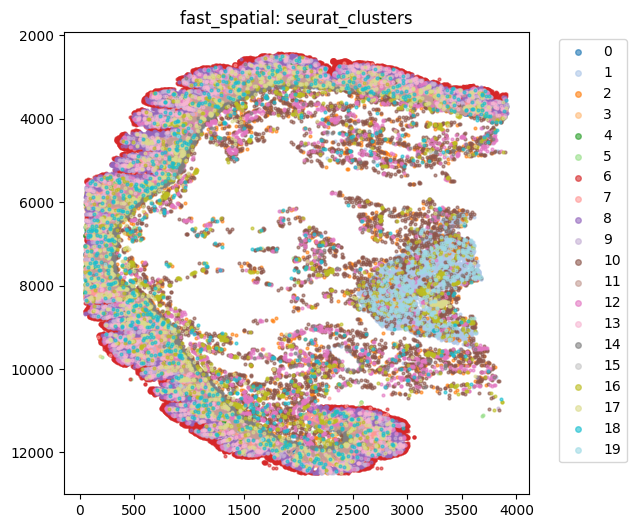

/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


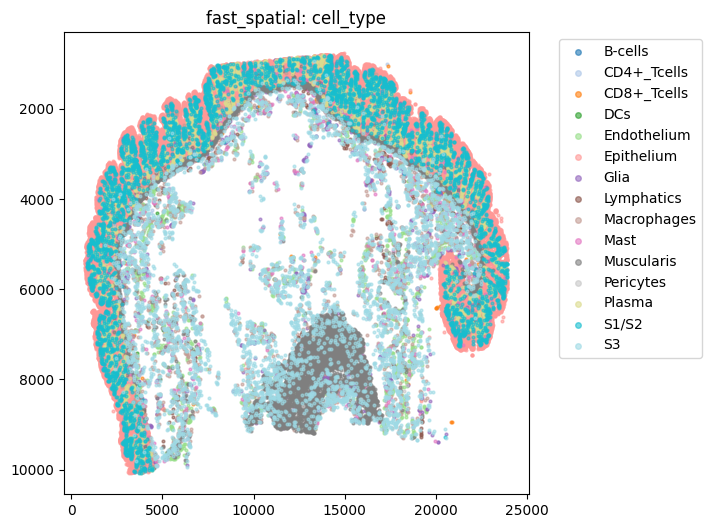

x:[735.1, 23937.8], y:[765.3, 10083.5]


In [5]:
# --- labelled single-cell data ---
adata_labelled = sc.read_h5ad("/project/simmons_hts/kxu/hest/xenium_labelled/h5ad/XeniumPR1S1ROI6.h5ad")

adata_labelled.obsm["spatial"] = adata_labelled.obs[["cell_centroid_x","cell_centroid_y"]].to_numpy()

fast_spatial(adata_labelled, 'predicted.id')
fast_spatial(adata_labelled, 'seurat_clusters')

# --- filter st.adata to WSI extent + drop Codeword features ---
update_st_with_filtered_and_labelled(st, adata_labelled, drop_codeword=True)

# --- align labelled cells to H&E pixel coords ---
px_um = st.meta["pixel_size"]
adata_labelled = align_labelled_to_he(adata_labelled, align_csv, pixel_size_um=px_um)

# standardize column names / annotate
adata_labelled = standardize_obs_columns(adata_labelled)
fast_spatial(adata_labelled, 'cell_type')

# --- quick sanity range of aligned coords ---
x_min, x_max, y_min, y_max = coord_range(adata_labelled.obsm["spatial"])
print(f"x:[{x_min:.1f}, {x_max:.1f}], y:[{y_min:.1f}, {y_max:.1f}]")

Before/After: {'old': {'num_cells': 1074150, 'cells_under_tissue': 1074150, 'transcripts_per_cell': 156, 'total_cell_area': 55846944.49765815}, 'new': {'num_cells': 66455, 'cells_under_tissue': 66455, 'transcripts_per_cell': 115.38504250996915, 'total_cell_area': 1103435.8068981587}}


/home/k/kxu/.local/lib/python3.11/site-packages/hest/HESTData.py:1390: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(adata, show=False, img_key="downscaled_fullres", color=[key], title=f"in_tissue spots", return_fig=True, **pl_kwargs)


saving to pyramidal tiff... can be slow


/home/k/kxu/.local/lib/python3.11/site-packages/hest/h5ad_reader.py:319: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


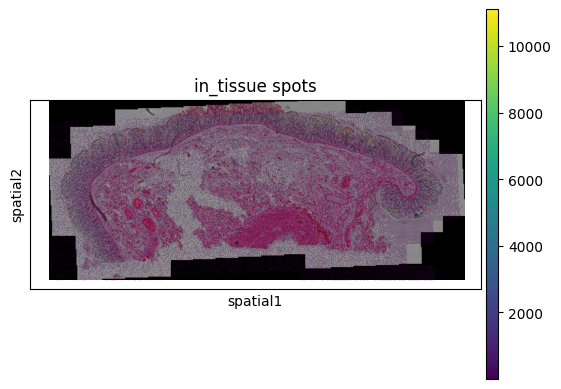

Overlay saved: /project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide1/ROI6/cell_plot.png


In [6]:
# reattach (after alignment/renames)
st.cell_adata = adata_labelled

# --- meta refresh ---
stats = refresh_meta_counts(st)
print("Before/After:", stats)

out_dir = Path("/project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide1/ROI6")
overlay_path = save_all(st, save_dir = out_dir,size=0.25)
print("Overlay saved:", overlay_path)

# XeniumPR1S1ROI7

In [7]:
# --- load data ---
exp_stem = Path("/project/simmons_hts/shared/20_11_2024_xenium_prime_run1/20241113__143534__SIMMONS_super_secret_prime_run1/output-XETG00283__0043739__Region_1__20241113__143611")
img_path = Path("/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/GI9613_Xenium5K_post_HnE.ome.tif")
align_csv = Path("/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/GI9613_Xenium5K_post_HnE_matrix.csv")

st = load_xenium_dataset(exp_stem, img_path, align_csv, use_dask=True, spot_size_um = spot_size)

Loading the WSI... (can be slow for large images)
Loading transcripts...
Pooling xenium transcripts in pseudo-visium spots...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Reading cells...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


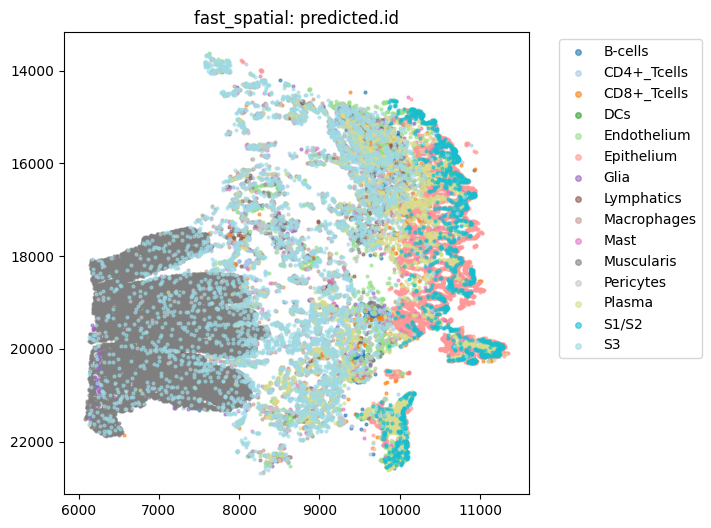

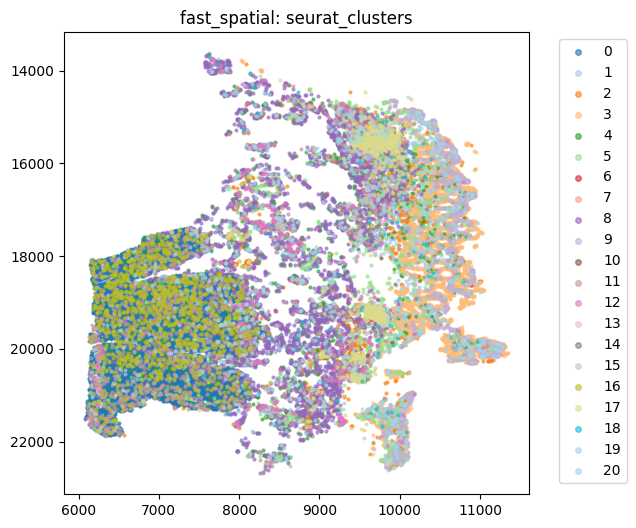

/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


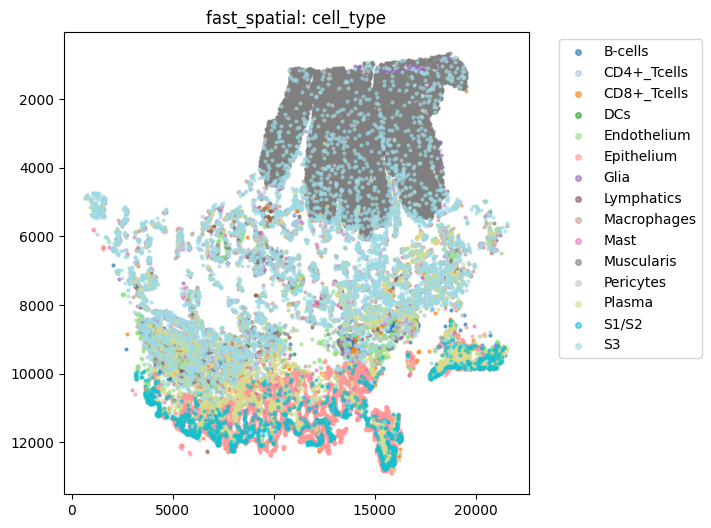

x:[643.4, 21563.5], y:[660.1, 12904.2]


In [8]:
# --- labelled single-cell data ---
adata_labelled = sc.read_h5ad("/project/simmons_hts/kxu/hest/xenium_labelled/h5ad/XeniumPR1S1ROI7.h5ad")

adata_labelled.obsm["spatial"] = adata_labelled.obs[["cell_centroid_x","cell_centroid_y"]].to_numpy()

fast_spatial(adata_labelled, 'predicted.id')
fast_spatial(adata_labelled, 'seurat_clusters')

# --- filter st.adata to WSI extent + drop Codeword features ---
update_st_with_filtered_and_labelled(st, adata_labelled, drop_codeword=True)

# --- align labelled cells to H&E pixel coords ---
px_um = st.meta["pixel_size"]
adata_labelled = align_labelled_to_he(adata_labelled, align_csv, pixel_size_um=px_um)

# standardize column names / annotate
adata_labelled = standardize_obs_columns(adata_labelled)
fast_spatial(adata_labelled, 'cell_type')

# --- quick sanity range of aligned coords ---
x_min, x_max, y_min, y_max = coord_range(adata_labelled.obsm["spatial"])
print(f"x:[{x_min:.1f}, {x_max:.1f}], y:[{y_min:.1f}, {y_max:.1f}]")

#### remove the right crack on H&E 

In [ ]:
# --- spot exclusions across full WSI (no cell bbox restriction) ---
# get spot coords from st.adata
xy = st.adata.obsm["spatial"]
sx, sy = xy[:, 0], xy[:, 1]

# full WSI bounding box
xmin, xmax, ymin, ymax = 0, st.wsi.width, 0, st.wsi.height

# rules (edit as you like)
rules = [
    #{"type": "corner", "corner": "bottom-right", "width": 0.2, "height": 0.48, "units": "frac"}
    {
      'type': 'trapezoid',
      'orientation': 'top',
      # vertical span = full image height (1.0 = 100% of bbox height)
      'top_width': 0.33,
      'bottom_width': 0.61,
      # horizontal depth = 10% of image width
        'center_offset': 0.5,
      'height': 1,
      'units': 'frac'
    }
]

# apply rule-based exclusions directly
final_keep = apply_spot_exclusions(sx, sy, (xmin, xmax, ymin, ymax), rules)

print(f"Spots kept after rules: {final_keep.sum()} / {len(final_keep)}")

# visualize with scanpy
sc.pl.spatial(
    st.adata[final_keep],
    size=0.25, 
    img_key="downscaled_fullres",
    color="total_counts",
    title="In-tissue spots (after rule exclusions)",
)

Spots kept after rules: 55441 / 74079


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/tmp/ipykernel_4038788/1028670188.py:31: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


In [10]:
adata=st.adata

In [ ]:
# reattach (after alignment/renames)
st.adata = st.adata[final_keep]
st.cell_adata = adata_labelled

# --- meta refresh ---
stats = refresh_meta_counts(st)
print("Before/After:", stats)

out_dir = Path("/project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide1/ROI7")
overlay_path = save_all(st, out_dir, pyramidal=True,size=0.25)
print("Overlay saved:", overlay_path)

Before/After: {'old': {'num_cells': 1074150, 'cells_under_tissue': 1074150, 'transcripts_per_cell': 156, 'total_cell_area': 55846944.49765815}, 'new': {'num_cells': 39354, 'cells_under_tissue': 39354, 'transcripts_per_cell': 76.94305534380241, 'total_cell_area': 611439.9356792163}}


/home/k/kxu/.local/lib/python3.11/site-packages/hest/HESTData.py:1390: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(adata, show=False, img_key="downscaled_fullres", color=[key], title=f"in_tissue spots", return_fig=True, **pl_kwargs)


saving to pyramidal tiff... can be slow


/home/k/kxu/.local/lib/python3.11/site-packages/hest/h5ad_reader.py:319: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


# XeniumPR1S1ROI8

In [12]:
# --- load data ---
exp_stem = Path("/project/simmons_hts/shared/20_11_2024_xenium_prime_run1/20241113__143534__SIMMONS_super_secret_prime_run1/output-XETG00283__0043739__Region_1__20241113__143611")
img_path  = Path(f"/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/OX932_stitched.ome.ome.tif")
align_csv = Path(f"/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/OX932_stitched.ome_matrix.csv")

st = load_xenium_dataset(exp_stem, img_path, align_csv, use_dask=True, spot_size_um = spot_size)

Loading the WSI... (can be slow for large images)
Loading transcripts...
Pooling xenium transcripts in pseudo-visium spots...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Reading cells...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


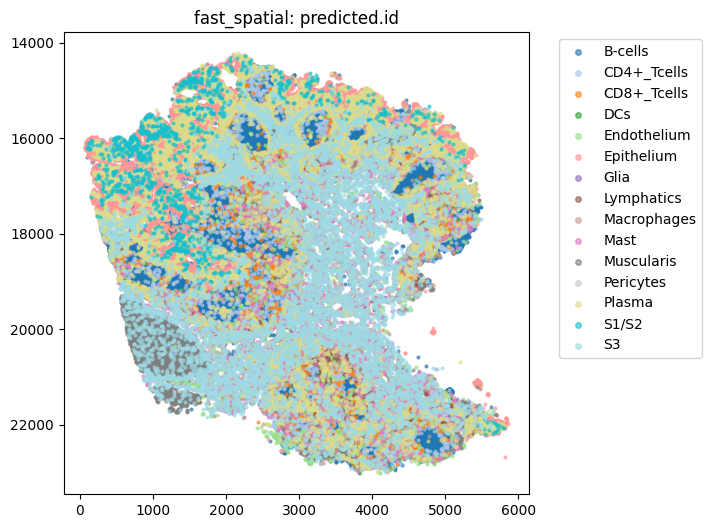

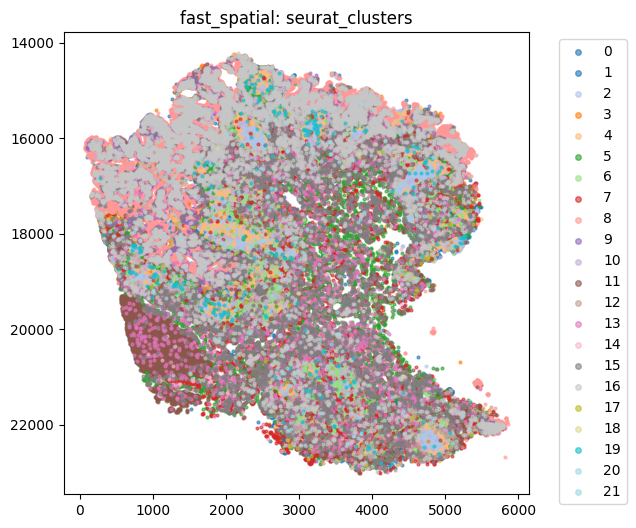

/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


In [ ]:
# --- labelled single-cell data ---
adata_labelled = sc.read_h5ad("/project/simmons_hts/kxu/hest/xenium_labelled/h5ad/XeniumPR1S1ROI8.h5ad")

adata_labelled.obsm["spatial"] = adata_labelled.obs[["cell_centroid_x","cell_centroid_y"]].to_numpy()

fast_spatial(adata_labelled, 'predicted.id')
fast_spatial(adata_labelled, 'seurat_clusters')

# --- filter st.adata to WSI extent + drop Codeword features ---
update_st_with_filtered_and_labelled(st, adata_labelled, drop_codeword=True)

# --- align labelled cells to H&E pixel coords ---
px_um = st.meta["pixel_size"]
adata_labelled = align_labelled_to_he(adata_labelled, align_csv, pixel_size_um=px_um)

# standardize column names / annotate
adata_labelled = standardize_obs_columns(adata_labelled)
fast_spatial(adata_labelled, 'cell_type')

# --- quick sanity range of aligned coords ---
x_min, x_max, y_min, y_max = coord_range(adata_labelled.obsm["spatial"])
print(f"x:[{x_min:.1f}, {x_max:.1f}], y:[{y_min:.1f}, {y_max:.1f}]")

Before/After: {'old': {'num_cells': 141857, 'cells_under_tissue': 141857, 'transcripts_per_cell': 108.0582769972578, 'total_cell_area': 2390081.5213944633}, 'new': {'num_cells': 141857, 'cells_under_tissue': 141857, 'transcripts_per_cell': 108.0582769972578, 'total_cell_area': 2390081.5213944633}}


/home/k/kxu/.local/lib/python3.11/site-packages/hest/HESTData.py:1390: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(adata, show=False, img_key="downscaled_fullres", color=[key], title=f"in_tissue spots", return_fig=True, **pl_kwargs)


saving to pyramidal tiff... can be slow


/home/k/kxu/.local/lib/python3.11/site-packages/hest/h5ad_reader.py:319: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


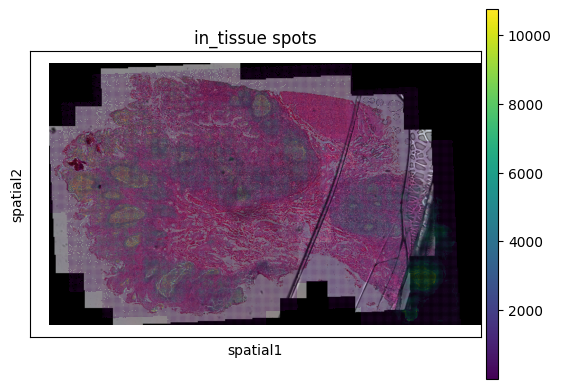

Overlay saved: /project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide1/ROI8/cell_plot.png


In [17]:
# reattach (after alignment/renames)
st.cell_adata = adata_labelled

# --- meta refresh ---
stats = refresh_meta_counts(st)
print("Before/After:", stats)

out_dir = Path("/project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide1/ROI8")
overlay_path = save_all(st, out_dir, pyramidal=True,size=0.25)
print("Overlay saved:", overlay_path)

# XeniumPR1S2ROI1

In [18]:
# only change sample ID once here
sample_id = "CAM005"
# exp_stem needs to be changed for slide 2
exp_stem = Path("/project/simmons_hts/shared/20_11_2024_xenium_prime_run1/20241113__143534__SIMMONS_super_secret_prime_run1/output-XETG00283__0043720__Region_1__20241113__143611")
img_path  = Path(f"/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/{sample_id}_Xenium5K_post_HnE.ome.tif")
align_csv = Path(f"/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/{sample_id}_Xenium5K_post_HnE_matrix.csv")
st = load_xenium_dataset(exp_stem, img_path, align_csv, use_dask=True, spot_size_um = spot_size)

Loading the WSI... (can be slow for large images)
Loading transcripts...
Pooling xenium transcripts in pseudo-visium spots...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Reading cells...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


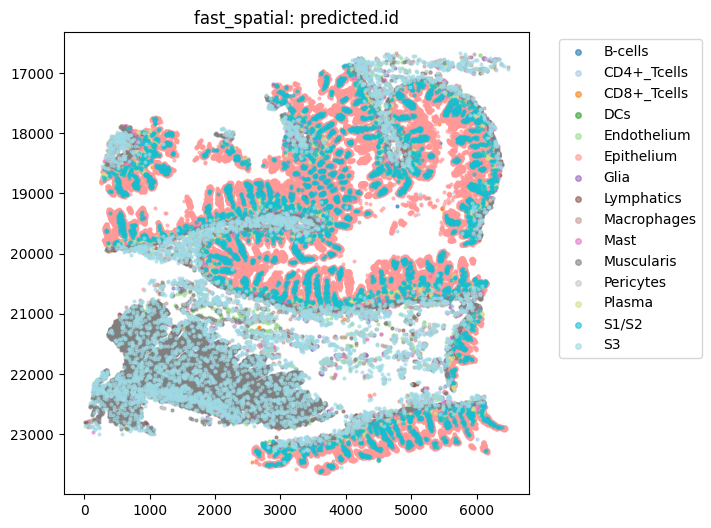

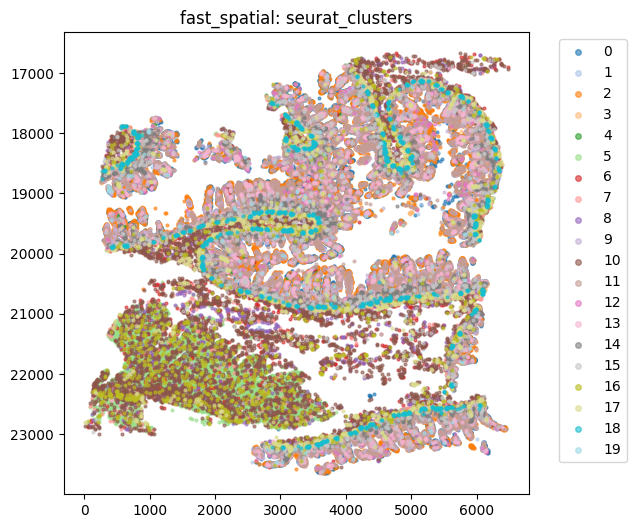

/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


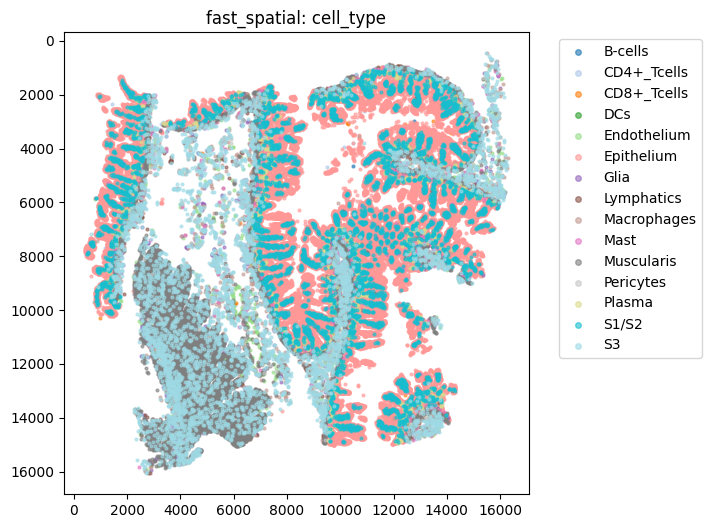

x:[410.4, 16280.8], y:[460.5, 16065.6]


In [19]:
# --- labelled single-cell data ---
adata_labelled = sc.read_h5ad("/project/simmons_hts/kxu/hest/xenium_labelled/h5ad/XeniumPR1S2ROI1.h5ad")

adata_labelled.obsm["spatial"] = adata_labelled.obs[["cell_centroid_x","cell_centroid_y"]].to_numpy()

fast_spatial(adata_labelled, 'predicted.id')
fast_spatial(adata_labelled, 'seurat_clusters')

# --- filter st.adata to WSI extent + drop Codeword features ---
update_st_with_filtered_and_labelled(st, adata_labelled, drop_codeword=True)

# --- align labelled cells to H&E pixel coords ---
px_um = st.meta["pixel_size"]
adata_labelled = align_labelled_to_he(adata_labelled, align_csv, pixel_size_um=px_um)

# standardize column names / annotate
adata_labelled = standardize_obs_columns(adata_labelled)
fast_spatial(adata_labelled, 'cell_type')

# --- quick sanity range of aligned coords ---
x_min, x_max, y_min, y_max = coord_range(adata_labelled.obsm["spatial"])
print(f"x:[{x_min:.1f}, {x_max:.1f}], y:[{y_min:.1f}, {y_max:.1f}]")

Spots kept after rules: 56962 / 59121


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/tmp/ipykernel_4038788/417261958.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


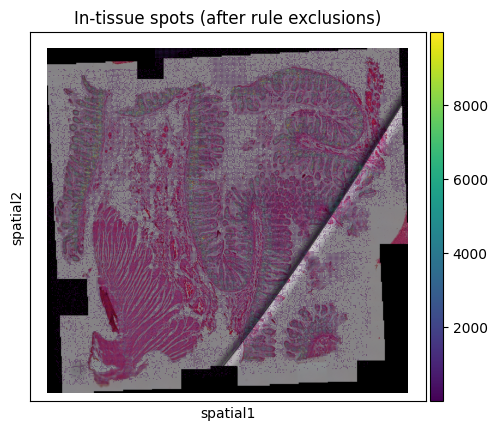

In [24]:
# --- spot exclusions across full WSI (no cell bbox restriction) ---

# get spot coords from st.adata
xy = st.adata.obsm["spatial"]
sx, sy = xy[:, 0], xy[:, 1]

# full WSI bounding box
xmin, xmax, ymin, ymax = 0, st.wsi.width, 0, st.wsi.height

# rules (edit as you like)
rules = [
    {"type": "corner", "corner": "bottom-right", "width": 0.1, "height": 0.54, "units": "frac"},
    {"type": "corner", "corner": "top-left", "width": 0.3, "height": 0.06, "units": "frac"}
]

# apply rule-based exclusions directly
final_keep = apply_spot_exclusions(sx, sy, (xmin, xmax, ymin, ymax), rules)

print(f"Spots kept after rules: {final_keep.sum()} / {len(final_keep)}")

# visualize with scanpy
sc.pl.spatial(
    st.adata[final_keep],
    size=0.25,
    img_key="downscaled_fullres",
    color="total_counts",
    title="In-tissue spots (after rule exclusions)",
)

In [21]:
adata=st.adata

In [23]:
st.adata=adata

In [ ]:
# reattach (after alignment/renames)
st.adata = st.adata[final_keep] # only when confirmed bounding box
st.cell_adata = adata_labelled

# --- meta refresh ---
stats = refresh_meta_counts(st)
print("Before/After:", stats)

out_dir = Path("/project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide2/ROI1")
overlay_path = save_all(st, out_dir, pyramidal=True,size=0.25)
print("Overlay saved:", overlay_path)

Before/After: {'old': {'num_cells': 83080, 'cells_under_tissue': 83080, 'transcripts_per_cell': 115.78176456427539, 'total_cell_area': 1373153.8742773067}, 'new': {'num_cells': 83080, 'cells_under_tissue': 83080, 'transcripts_per_cell': 115.78176456427539, 'total_cell_area': 1373153.8742773067}}


/home/k/kxu/.local/lib/python3.11/site-packages/hest/HESTData.py:1390: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(adata, show=False, img_key="downscaled_fullres", color=[key], title=f"in_tissue spots", return_fig=True, **pl_kwargs)


saving to pyramidal tiff... can be slow


/home/k/kxu/.local/lib/python3.11/site-packages/hest/h5ad_reader.py:319: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


# XeniumPR1S2ROI2

In [26]:
# only change sample ID once here
sample_id = "GI9662"
exp_stem = Path("/project/simmons_hts/shared/20_11_2024_xenium_prime_run1/20241113__143534__SIMMONS_super_secret_prime_run1/output-XETG00283__0043720__Region_1__20241113__143611")
img_path  = Path(f"/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/{sample_id}_Xenium5K_post_HnE.ome.tif")
align_csv = Path(f"/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/{sample_id}_Xenium5K_post_HnE_matrix.csv")
st = load_xenium_dataset(exp_stem, img_path, align_csv, use_dask=True, spot_size_um = spot_size)

Loading the WSI... (can be slow for large images)
Loading transcripts...
Pooling xenium transcripts in pseudo-visium spots...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Reading cells...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


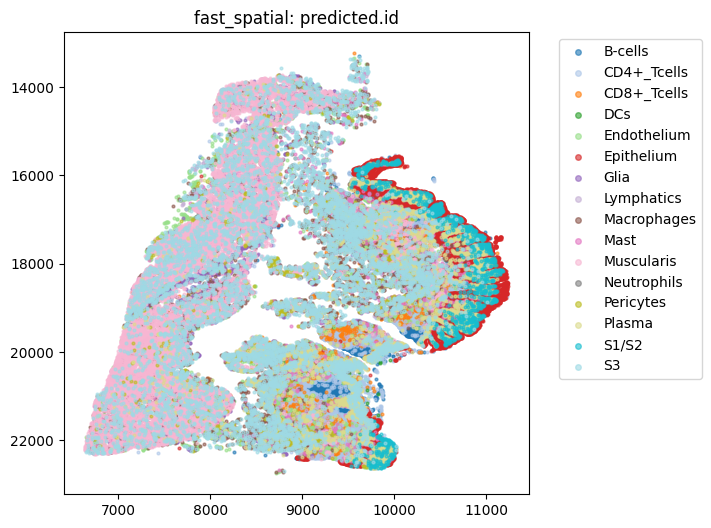

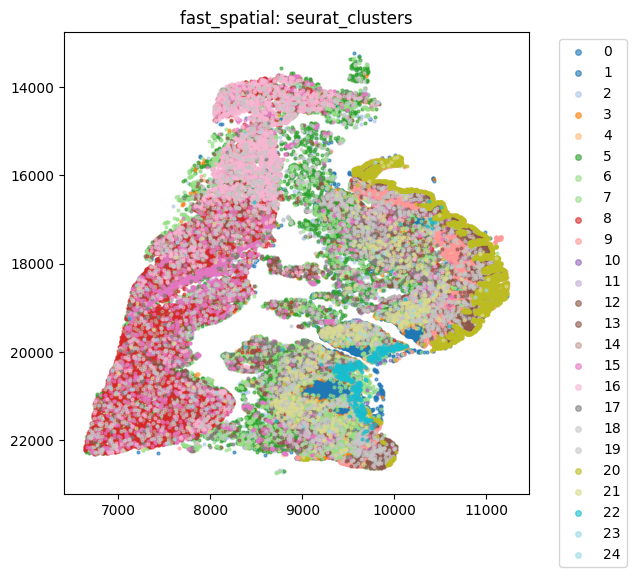

/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


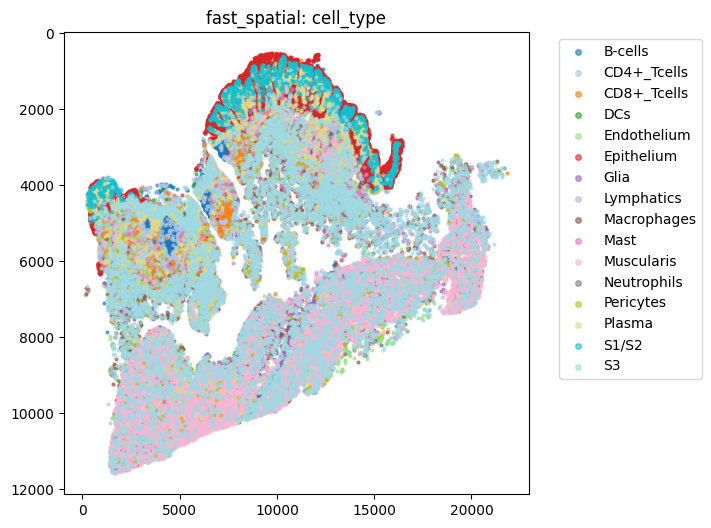

x:[116.4, 21854.5], y:[531.6, 11577.2]


In [27]:
# --- labelled single-cell data ---
adata_labelled = sc.read_h5ad("/project/simmons_hts/kxu/hest/xenium_labelled/h5ad/XeniumPR1S2ROI2.h5ad")

adata_labelled.obsm["spatial"] = adata_labelled.obs[["cell_centroid_x","cell_centroid_y"]].to_numpy()

fast_spatial(adata_labelled, 'predicted.id')
fast_spatial(adata_labelled, 'seurat_clusters')

# --- filter st.adata to WSI extent + drop Codeword features ---
update_st_with_filtered_and_labelled(st, adata_labelled, drop_codeword=True)

# --- align labelled cells to H&E pixel coords ---
px_um = st.meta["pixel_size"]
adata_labelled = align_labelled_to_he(adata_labelled, align_csv, pixel_size_um=px_um)

# standardize column names / annotate
adata_labelled = standardize_obs_columns(adata_labelled)
fast_spatial(adata_labelled, 'cell_type')

# --- quick sanity range of aligned coords ---
x_min, x_max, y_min, y_max = coord_range(adata_labelled.obsm["spatial"])
print(f"x:[{x_min:.1f}, {x_max:.1f}], y:[{y_min:.1f}, {y_max:.1f}]")

Spots kept after rules: 48434 / 48665


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/tmp/ipykernel_4038788/3260238848.py:21: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


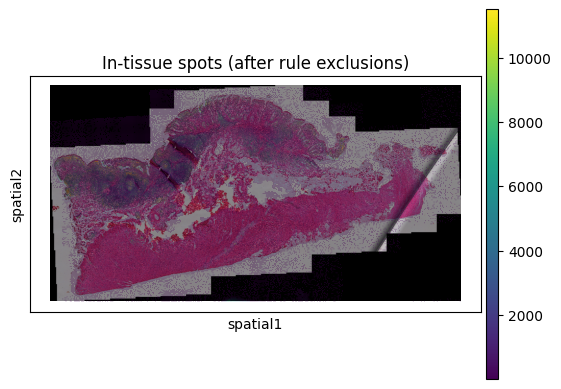

In [28]:
# --- spot exclusions across full WSI (no cell bbox restriction) ---

# get spot coords from st.adata
xy = st.adata.obsm["spatial"]
sx, sy = xy[:, 0], xy[:, 1]

# full WSI bounding box
xmin, xmax, ymin, ymax = 0, st.wsi.width, 0, st.wsi.height

# rules (edit as you like)
rules = [
    {"type": "corner", "corner": "bottom-left", "width": 0.03, "height": 0.53, "units": "frac"},
]

# apply rule-based exclusions directly
final_keep = apply_spot_exclusions(sx, sy, (xmin, xmax, ymin, ymax), rules)

print(f"Spots kept after rules: {final_keep.sum()} / {len(final_keep)}")

# visualize with scanpy
sc.pl.spatial(
    st.adata[final_keep],
    size=0.25,
    img_key="downscaled_fullres",
    color="total_counts",
    title="In-tissue spots (after rule exclusions)",
)

In [29]:
adata=st.adata

In [30]:
st.adata=adata

In [ ]:
# reattach (after alignment/renames)
st.adata = st.adata[final_keep]
st.cell_adata = adata_labelled

# --- meta refresh ---
stats = refresh_meta_counts(st)
print("Before/After:", stats)

out_dir = Path("/project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide2/ROI2")
overlay_path = save_all(st, out_dir, pyramidal=True, size=0.25)
print("Overlay saved:", overlay_path)

# XeniumPR1S3ROI3

In [4]:
# only change sample ID once here
sample_id = "GI7051"
exp_stem = Path("/project/simmons_hts/shared/20_11_2024_xenium_prime_run1/20241113__143534__SIMMONS_super_secret_prime_run1/output-XETG00283__0043720__Region_1__20241113__143611")
img_path  = Path(f"/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/{sample_id}_Xenium5K_post_HnE.ome.tif")
align_csv = Path(f"/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/{sample_id}_Xenium5K_post_HnE_matrix.csv")
st = load_xenium_dataset(exp_stem, img_path, align_csv, use_dask=True, spot_size_um = spot_size)

Loading the WSI... (can be slow for large images)
Loading transcripts...
Pooling xenium transcripts in pseudo-visium spots...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Reading cells...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


In [5]:
# --- labelled single-cell data ---
adata_labelled = sc.read_h5ad("/project/simmons_hts/kxu/hest/xenium_labelled/h5ad/XeniumPR1S2ROI3.h5ad")

adata_labelled.obsm["spatial"] = adata_labelled.obs[["cell_centroid_x","cell_centroid_y"]].to_numpy()

#fast_spatial(adata_labelled, 'predicted.id')
#fast_spatial(adata_labelled, 'seurat_clusters')

# --- filter st.adata to WSI extent + drop Codeword features ---
update_st_with_filtered_and_labelled(st, adata_labelled, drop_codeword=True)

# --- align labelled cells to H&E pixel coords ---
px_um = st.meta["pixel_size"]
adata_labelled = align_labelled_to_he(adata_labelled, align_csv, pixel_size_um=px_um)

# standardize column names / annotate
adata_labelled = standardize_obs_columns(adata_labelled)
#fast_spatial(adata_labelled, 'cell_type')

# --- quick sanity range of aligned coords ---
x_min, x_max, y_min, y_max = coord_range(adata_labelled.obsm["spatial"])
print(f"x:[{x_min:.1f}, {x_max:.1f}], y:[{y_min:.1f}, {y_max:.1f}]")

/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


x:[896.6, 13942.0], y:[1069.7, 11808.6]


Spots kept after rules: 29925 / 33301


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/tmp/ipykernel_4134799/2750508810.py:22: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


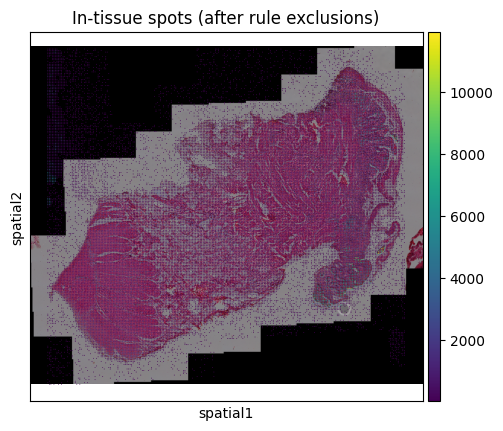

In [6]:
# --- spot exclusions across full WSI ---

# get spot coords from st.adata
xy = st.adata.obsm["spatial"]
sx, sy = xy[:, 0], xy[:, 1]

# full WSI bounding box
xmin, xmax, ymin, ymax = 0, st.wsi.width, 0, st.wsi.height

# rules (edit as you like)
rules = [
    {"type": "strip", "side": "right", "size": 0.09, "units": "frac"},
    {"type": "strip", "side": "left", "size": 0.04, "units": "frac"}
]

# apply rule-based exclusions directly
final_keep = apply_spot_exclusions(sx, sy, (xmin, xmax, ymin, ymax), rules)

print(f"Spots kept after rules: {final_keep.sum()} / {len(final_keep)}")

# visualize with scanpy
sc.pl.spatial(
    st.adata[final_keep],
    size=0.25,
    img_key="downscaled_fullres",
    color="total_counts",
    title="In-tissue spots (after rule exclusions)",
)

Before/After: {'old': {'num_cells': 1090005, 'cells_under_tissue': 1090005, 'transcripts_per_cell': 140, 'total_cell_area': 53266916.81791191}, 'new': {'num_cells': 27162, 'cells_under_tissue': 27162, 'transcripts_per_cell': 88.31967454532067, 'total_cell_area': 432808.7755936795}}


/home/k/kxu/.local/lib/python3.11/site-packages/hest/HESTData.py:1390: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(adata, show=False, img_key="downscaled_fullres", color=[key], title=f"in_tissue spots", return_fig=True, **pl_kwargs)


saving to pyramidal tiff... can be slow


/home/k/kxu/.local/lib/python3.11/site-packages/hest/h5ad_reader.py:319: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


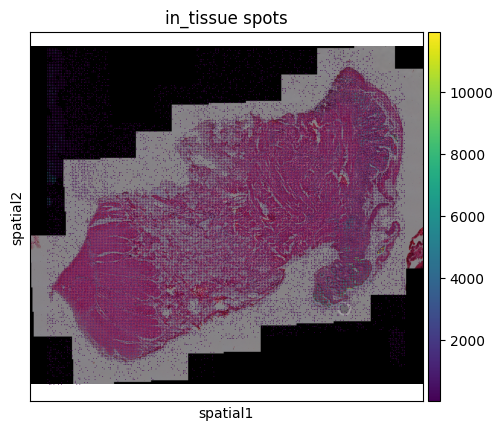

Overlay saved: /project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide2/ROI3/cell_plot.png


In [7]:
# reattach (after alignment/renames)
st.adata = st.adata[final_keep]
st.cell_adata = adata_labelled

# --- meta refresh ---
stats = refresh_meta_counts(st)
print("Before/After:", stats)

out_dir = Path("/project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide2/ROI3")
overlay_path = save_all(st, out_dir, pyramidal=True, size=0.25)
print("Overlay saved:", overlay_path)

# XeniumPR1S2ROI4

In [8]:
# only change sample ID once here
sample_id = "GI6966"
exp_stem = Path("/project/simmons_hts/shared/20_11_2024_xenium_prime_run1/20241113__143534__SIMMONS_super_secret_prime_run1/output-XETG00283__0043720__Region_1__20241113__143611")
img_path  = Path(f"/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/{sample_id}_Xenium5K_post_HnE.ome.tif")
align_csv = Path(f"/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/{sample_id}_Xenium5K_post_HnE_matrix.csv")
st = load_xenium_dataset(exp_stem, img_path, align_csv, use_dask=True, spot_size_um = spot_size)

Loading the WSI... (can be slow for large images)
Loading transcripts...
Pooling xenium transcripts in pseudo-visium spots...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Reading cells...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


In [9]:
# --- labelled single-cell data ---
adata_labelled = sc.read_h5ad("/project/simmons_hts/kxu/hest/xenium_labelled/h5ad/XeniumPR1S2ROI4.h5ad")

adata_labelled.obsm["spatial"] = adata_labelled.obs[["cell_centroid_x","cell_centroid_y"]].to_numpy()

#fast_spatial(adata_labelled, 'predicted.id')
#fast_spatial(adata_labelled, 'seurat_clusters')

# --- filter st.adata to WSI extent + drop Codeword features ---
update_st_with_filtered_and_labelled(st, adata_labelled, drop_codeword=True)

# --- align labelled cells to H&E pixel coords ---
px_um = st.meta["pixel_size"]
adata_labelled = align_labelled_to_he(adata_labelled, align_csv, pixel_size_um=px_um)

# standardize column names / annotate
adata_labelled = standardize_obs_columns(adata_labelled)
#fast_spatial(adata_labelled, 'cell_type')

/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


In [ ]:
# --- spot exclusions across full WSI ---
# get spot coords from st.adata
xy = st.adata.obsm["spatial"]
sx, sy = xy[:, 0], xy[:, 1]

# full WSI bounding box
xmin, xmax, ymin, ymax = 0, st.wsi.width, 0, st.wsi.height

# rules (edit as you like)
rules = [
    {"type": "strip", "side": "right", "size": 0.04, "units": "frac"},
    {"type": "strip", "side": "left", "size": 0.01, "units": "frac"}
]

# apply rule-based exclusions directly
final_keep = apply_spot_exclusions(sx, sy, (xmin, xmax, ymin, ymax), rules)

print(f"Spots kept after rules: {final_keep.sum()} / {len(final_keep)}")

# visualize with scanpy
sc.pl.spatial(
    st.adata[final_keep],
    size=0.25,
    img_key="downscaled_fullres",
    color="total_counts",
    title="In-tissue spots (after rule exclusions)",
)

Spots kept after rules: 49416 / 49416


/tmp/ipykernel_4134799/1035526079.py:21: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


In [15]:
adata=st.adata

In [19]:
st.adata = adata

In [ ]:
# reattach (after alignment/renames)
st.adata = st.adata[final_keep]
st.cell_adata = adata_labelled

# --- meta refresh ---
stats = refresh_meta_counts(st)
print("Before/After:", stats)

out_dir = Path("/project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide2/ROI4")
overlay_path = save_all(st, out_dir, pyramidal=True, size=0.25)
print("Overlay saved:", overlay_path)

Before/After: {'old': {'num_cells': 47925, 'cells_under_tissue': 47925, 'transcripts_per_cell': 86.23106937923839, 'total_cell_area': 766544.4972244431}, 'new': {'num_cells': 47925, 'cells_under_tissue': 47925, 'transcripts_per_cell': 86.23106937923839, 'total_cell_area': 766544.4972244431}}


/home/k/kxu/.local/lib/python3.11/site-packages/hest/HESTData.py:1390: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(adata, show=False, img_key="downscaled_fullres", color=[key], title=f"in_tissue spots", return_fig=True, **pl_kwargs)


saving to pyramidal tiff... can be slow


/home/k/kxu/.local/lib/python3.11/site-packages/hest/h5ad_reader.py:319: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


# XeniumPR1S2ROI5

In [22]:
# only change sample ID once here
sample_id = "TIP522"
exp_stem = Path("/project/simmons_hts/shared/20_11_2024_xenium_prime_run1/20241113__143534__SIMMONS_super_secret_prime_run1/output-XETG00283__0043720__Region_1__20241113__143611")
img_path  = Path(f"/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/{sample_id}_Xenium5K_post_HnE.ome.tif")
align_csv = Path(f"/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/{sample_id}_Xenium5K_post_HnE_matrix.csv")
st = load_xenium_dataset(exp_stem, img_path, align_csv, use_dask=True, spot_size_um = spot_size)

Loading the WSI... (can be slow for large images)
Loading transcripts...
Pooling xenium transcripts in pseudo-visium spots...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Reading cells...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


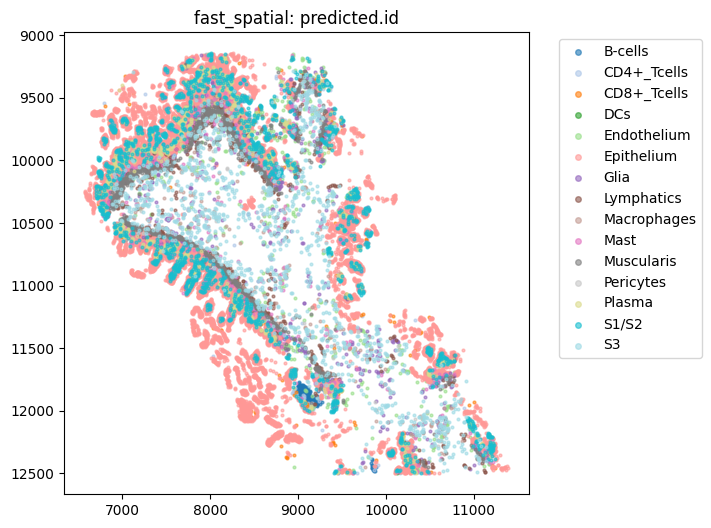

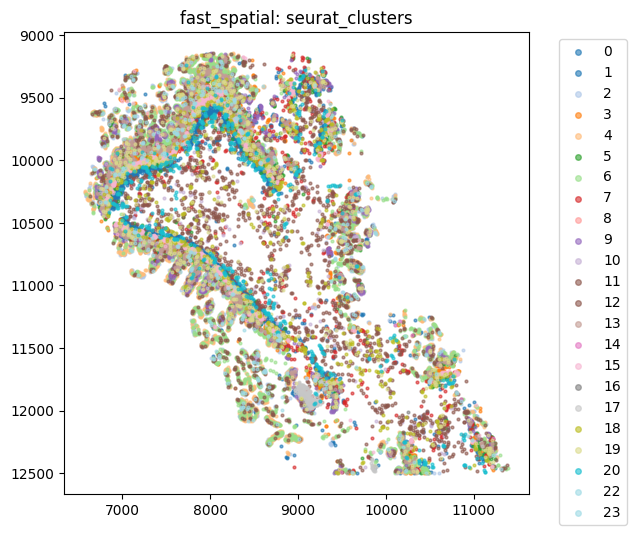

/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


In [ ]:
# --- labelled single-cell data ---
adata_labelled = sc.read_h5ad("/project/simmons_hts/kxu/hest/xenium_labelled/h5ad/XeniumPR1S2ROI5.h5ad")

adata_labelled.obsm["spatial"] = adata_labelled.obs[["cell_centroid_x","cell_centroid_y"]].to_numpy()

fast_spatial(adata_labelled, 'predicted.id')
fast_spatial(adata_labelled, 'seurat_clusters')

# --- filter st.adata to WSI extent + drop Codeword features ---
update_st_with_filtered_and_labelled(st, adata_labelled, drop_codeword=True)

# --- align labelled cells to H&E pixel coords ---
px_um = st.meta["pixel_size"]
adata_labelled = align_labelled_to_he(adata_labelled, align_csv, pixel_size_um=px_um)

# standardize column names / annotate
adata_labelled = standardize_obs_columns(adata_labelled)
fast_spatial(adata_labelled, 'cell_type')

Before/After: {'old': {'num_cells': 1090005, 'cells_under_tissue': 1090005, 'transcripts_per_cell': 140, 'total_cell_area': 53266916.81791191}, 'new': {'num_cells': 21234, 'cells_under_tissue': 21234, 'transcripts_per_cell': 123.94358104926062, 'total_cell_area': 353326.6052291087}}


/home/k/kxu/.local/lib/python3.11/site-packages/hest/HESTData.py:1390: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(adata, show=False, img_key="downscaled_fullres", color=[key], title=f"in_tissue spots", return_fig=True, **pl_kwargs)


saving to pyramidal tiff... can be slow


/home/k/kxu/.local/lib/python3.11/site-packages/hest/h5ad_reader.py:319: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


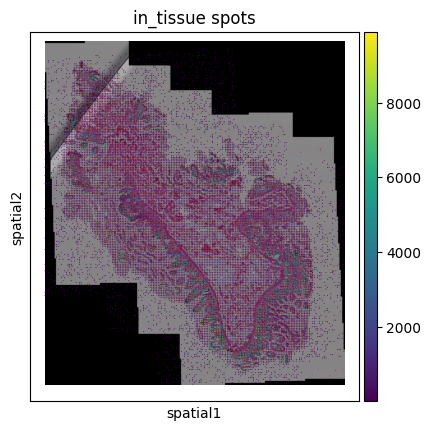

Overlay saved: /project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide2/ROI5/cell_plot.png


In [24]:
# reattach (after alignment/renames)
st.cell_adata = adata_labelled

# --- meta refresh ---
stats = refresh_meta_counts(st)
print("Before/After:", stats)

out_dir = Path("/project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide2/ROI5")
overlay_path = save_all(st, out_dir, pyramidal=True,size=0.25)
print("Overlay saved:", overlay_path)

# XeniumPR1S2ROI6

In [25]:
# only change sample ID once here
sample_id = "TIP815"
exp_stem = Path("/project/simmons_hts/shared/20_11_2024_xenium_prime_run1/20241113__143534__SIMMONS_super_secret_prime_run1/output-XETG00283__0043720__Region_1__20241113__143611")
img_path  = Path(f"/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/{sample_id}_Xenium5K_post_HnE.ome.tif")
align_csv = Path(f"/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/{sample_id}_Xenium5K_post_HnE_matrix.csv")
st = load_xenium_dataset(exp_stem, img_path, align_csv, use_dask=True, spot_size_um = spot_size)

Loading the WSI... (can be slow for large images)
Loading transcripts...
Pooling xenium transcripts in pseudo-visium spots...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Reading cells...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


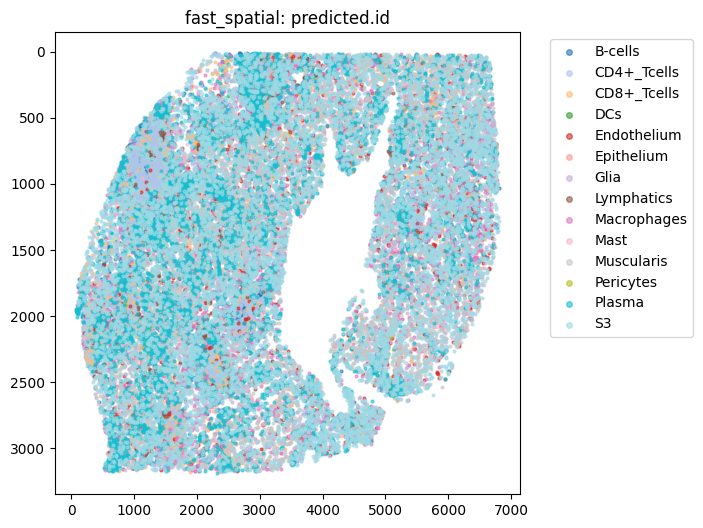

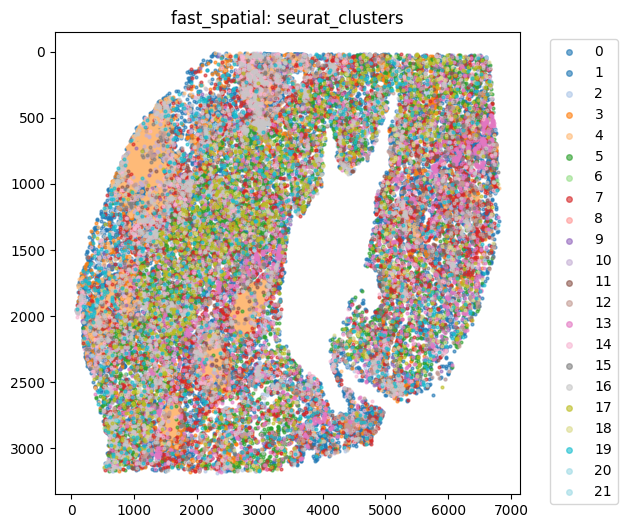

/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


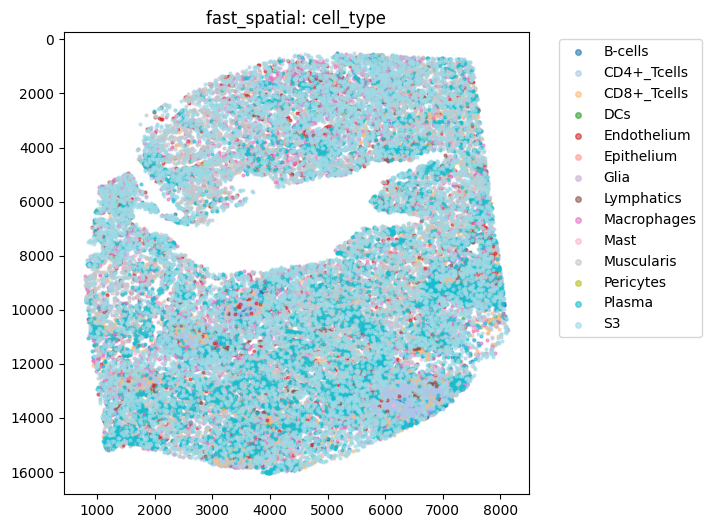

In [26]:
# --- labelled single-cell data ---
adata_labelled = sc.read_h5ad("/project/simmons_hts/kxu/hest/xenium_labelled/h5ad/XeniumPR1S2ROI6.h5ad")

adata_labelled.obsm["spatial"] = adata_labelled.obs[["cell_centroid_x","cell_centroid_y"]].to_numpy()

fast_spatial(adata_labelled, 'predicted.id')
fast_spatial(adata_labelled, 'seurat_clusters')

# --- filter st.adata to WSI extent + drop Codeword features ---
update_st_with_filtered_and_labelled(st, adata_labelled, drop_codeword=True)

# --- align labelled cells to H&E pixel coords ---
px_um = st.meta["pixel_size"]
adata_labelled = align_labelled_to_he(adata_labelled, align_csv, pixel_size_um=px_um)

# standardize column names / annotate
adata_labelled = standardize_obs_columns(adata_labelled)
fast_spatial(adata_labelled, 'cell_type')

Spots kept after rules: 28157 / 28932


/tmp/ipykernel_4134799/3692644958.py:20: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


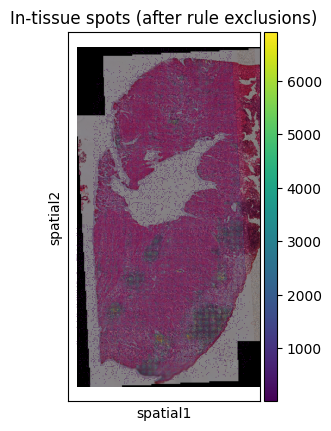

In [28]:
# --- spot exclusions across full WSI (no cell bbox restriction) ---
# get spot coords from st.adata
xy = st.adata.obsm["spatial"]
sx, sy = xy[:, 0], xy[:, 1]

# full WSI bounding box
xmin, xmax, ymin, ymax = 0, st.wsi.width, 0, st.wsi.height

# rules (edit as you like)
rules = [
    {"type": "corner", "corner": "top-left", "width": 0.07, "height": 0.52, "units": "frac"}
]

# apply rule-based exclusions directly
final_keep = apply_spot_exclusions(sx, sy, (xmin, xmax, ymin, ymax), rules)

print(f"Spots kept after rules: {final_keep.sum()} / {len(final_keep)}")

# visualize with scanpy
sc.pl.spatial(
    st.adata[final_keep],
    size=0.25,
    img_key="downscaled_fullres",
    color="total_counts",
    title="In-tissue spots (after rule exclusions)",
)

Before/After: {'old': {'num_cells': 1090005, 'cells_under_tissue': 1090005, 'transcripts_per_cell': 140, 'total_cell_area': 53266916.81791191}, 'new': {'num_cells': 52284, 'cells_under_tissue': 52284, 'transcripts_per_cell': 95.0392089358121, 'total_cell_area': 833128.6477618205}}


/home/k/kxu/.local/lib/python3.11/site-packages/hest/HESTData.py:1390: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(adata, show=False, img_key="downscaled_fullres", color=[key], title=f"in_tissue spots", return_fig=True, **pl_kwargs)


saving to pyramidal tiff... can be slow


/home/k/kxu/.local/lib/python3.11/site-packages/hest/h5ad_reader.py:319: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


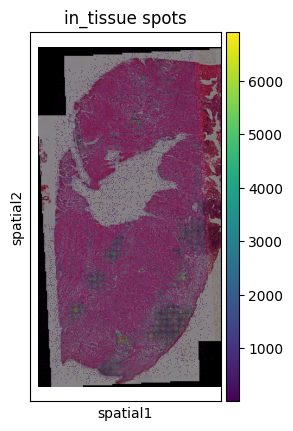

Overlay saved: /project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide2/ROI6/cell_plot.png


In [29]:
# reattach (after alignment/renames)
st.adata = st.adata[final_keep]
st.cell_adata = adata_labelled

# --- meta refresh ---
stats = refresh_meta_counts(st)
print("Before/After:", stats)

out_dir = Path("/project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide2/ROI6")
overlay_path = save_all(st, out_dir, pyramidal=True, size=0.25)
print("Overlay saved:", overlay_path)

# XeniumPR1S2ROI7

In [30]:
# only change sample ID once here
sample_id = "TIP864"
exp_stem = Path("/project/simmons_hts/shared/20_11_2024_xenium_prime_run1/20241113__143534__SIMMONS_super_secret_prime_run1/output-XETG00283__0043720__Region_1__20241113__143611")
img_path  = Path(f"/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/{sample_id}_Xenium5K_post_HnE.ome.tif")
align_csv = Path(f"/project/simmons_hts/jpark/1_project/0_xenium/RUNTRexBio/post_HnE/{sample_id}_Xenium5K_post_HnE_matrix.csv")
st = load_xenium_dataset(exp_stem, img_path, align_csv, use_dask=True, spot_size_um = spot_size)

Loading the WSI... (can be slow for large images)
Loading transcripts...
Pooling xenium transcripts in pseudo-visium spots...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


Reading cells...


/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


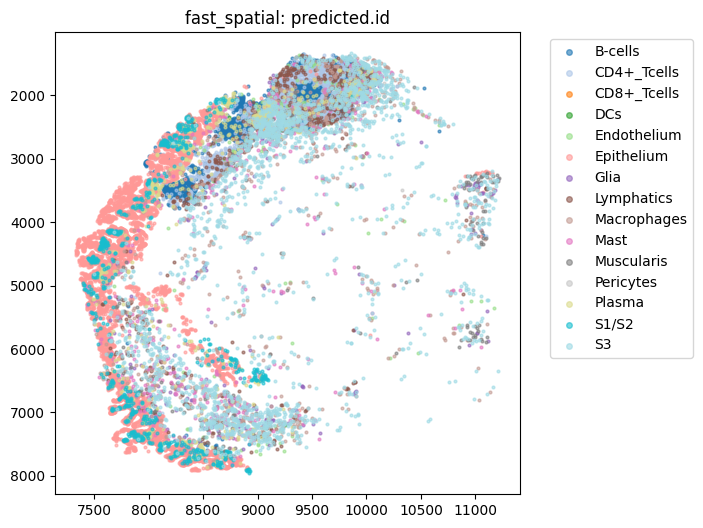

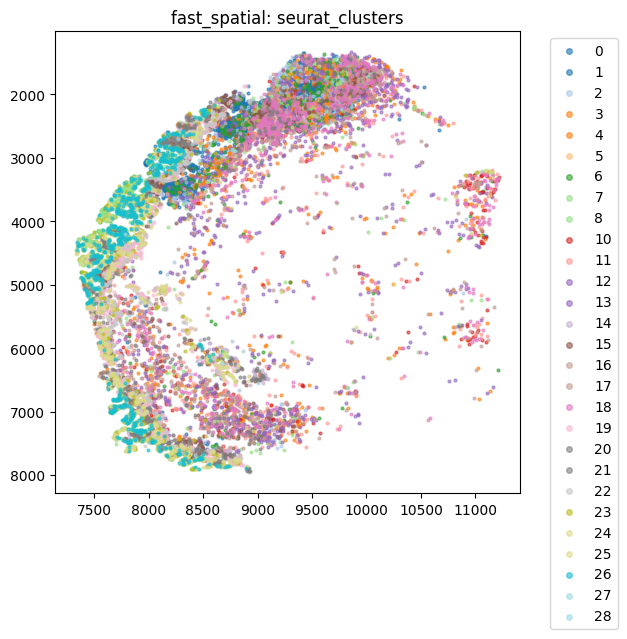

/package/python-cbrg/current/3.11.3/lib/python3.11/site-packages/anndata/_core/anndata.py:1105: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


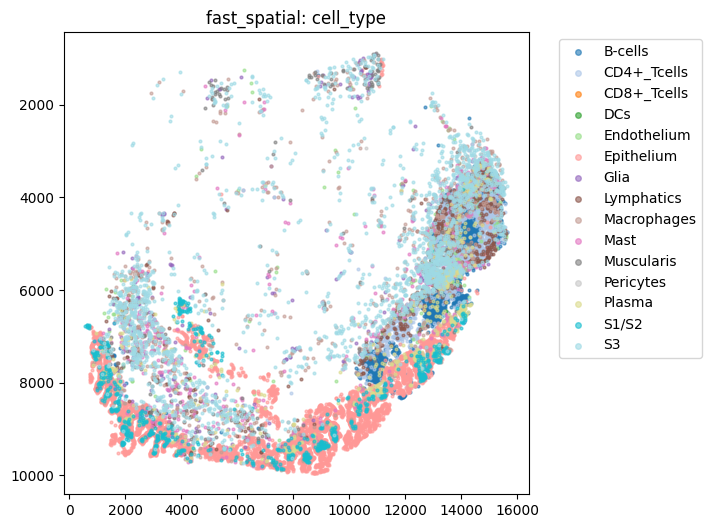

In [31]:
# --- labelled single-cell data ---
adata_labelled = sc.read_h5ad("/project/simmons_hts/kxu/hest/xenium_labelled/h5ad/XeniumPR1S2ROI7.h5ad")

adata_labelled.obsm["spatial"] = adata_labelled.obs[["cell_centroid_x","cell_centroid_y"]].to_numpy()

fast_spatial(adata_labelled, 'predicted.id')
fast_spatial(adata_labelled, 'seurat_clusters')

# --- filter st.adata to WSI extent + drop Codeword features ---
update_st_with_filtered_and_labelled(st, adata_labelled, drop_codeword=True)

# --- align labelled cells to H&E pixel coords ---
px_um = st.meta["pixel_size"]
adata_labelled = align_labelled_to_he(adata_labelled, align_csv, pixel_size_um=px_um)

# standardize column names / annotate
adata_labelled = standardize_obs_columns(adata_labelled)
fast_spatial(adata_labelled, 'cell_type')

Before/After: {'old': {'num_cells': 1090005, 'cells_under_tissue': 1090005, 'transcripts_per_cell': 140, 'total_cell_area': 53266916.81791191}, 'new': {'num_cells': 15941, 'cells_under_tissue': 15941, 'transcripts_per_cell': 58.48886519038956, 'total_cell_area': 245697.36461167}}


/home/k/kxu/.local/lib/python3.11/site-packages/hest/HESTData.py:1390: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  fig = sc.pl.spatial(adata, show=False, img_key="downscaled_fullres", color=[key], title=f"in_tissue spots", return_fig=True, **pl_kwargs)


saving to pyramidal tiff... can be slow


/home/k/kxu/.local/lib/python3.11/site-packages/hest/h5ad_reader.py:319: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


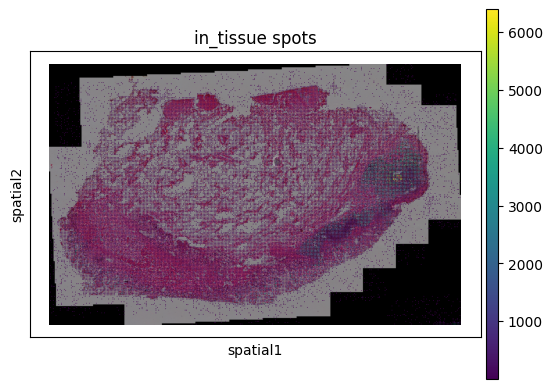

Overlay saved: /project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide2/ROI7/cell_plot.png


In [32]:
st.cell_adata = adata_labelled

# --- meta refresh ---
stats = refresh_meta_counts(st)
print("Before/After:", stats)

out_dir = Path("/project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/slide2/ROI7")
overlay_path = save_all(st, out_dir, pyramidal=True,size=0.25)
print("Overlay saved:", overlay_path)

# Visualise all samples

In [35]:
from pathlib import Path
import math
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image, ImageOps
import numpy as np

def show_all_plots_in_grid_downsampled(
    base_dir: str | Path,
    pattern: str = "*cell_plot*.png",
    ncols: int = 3,
    figsize=(16, 10),
    max_side: int = 800,
    per_page: int | None = 12,
    resample=Image.LANCZOS,
    save_dir: str | Path | None = None,
    save_prefix: str = "plots",
    show: bool = True,
    dpi: int = 150,
):
    """
    Recursively search for images, downsample and display in a grid.
    Optionally save each page to PNG files in save_dir with prefix save_prefix.

    Minimal change from your existing function: only adds saving behavior.
    """
    base_dir = Path(base_dir)
    imgs = sorted(base_dir.rglob(pattern))
    if not imgs:
        print(f"No images found matching '{pattern}' under {base_dir}")
        return

    if save_dir is not None:
        save_dir = Path(save_dir)
        save_dir.mkdir(parents=True, exist_ok=True)

    def load_thumbnail(path: Path, max_side: int):
        with Image.open(path) as im:
            im = ImageOps.exif_transpose(im)
            if im.mode not in ("RGB", "L"):
                im = im.convert("RGB")
            im.thumbnail((max_side, max_side), resample=resample)
            return np.asarray(im)

    total = len(imgs)
    per_page = total if per_page is None else per_page
    pages = math.ceil(total / per_page)

    for page in range(pages):
        start = page * per_page
        end = min(start + per_page, total)
        page_imgs = imgs[start:end]
        n = len(page_imgs)
        nrows = math.ceil(n / ncols)

        fig, axes = plt.subplots(nrows, ncols, figsize=figsize)
        if isinstance(axes, np.ndarray):
            axes = axes.flatten()
        else:
            axes = [axes]

        for ax in axes:
            ax.axis("off")

        for ax, img_path in zip(axes, page_imgs):
            try:
                arr = load_thumbnail(img_path, max_side=max_side)
                rel_path = img_path.relative_to(base_dir)
                ax.imshow(arr)
                ax.set_title(str(rel_path), fontsize=8)
            except Exception as e:
                ax.text(0.5, 0.5, f"Error\n{img_path.name}", ha="center")
                ax.set_title(str(img_path.name), fontsize=8)
            ax.axis("off")

        for ax in axes[len(page_imgs):]:
            ax.axis("off")

        plt.tight_layout()

        # --- Save each page as PNG if requested (minimal change) ---
        if save_dir is not None:
            fname = f"{save_prefix}_page_{page+1:02d}.png"
            outpath = save_dir / fname
            fig.savefig(outpath, dpi=dpi, bbox_inches="tight")
            print(f"Saved page {page+1}/{pages} -> {outpath}")

        # Show interactive figure if requested
        if show:
            plt.show()
        else:
            plt.close(fig)
            

In [36]:
show_all_plots_in_grid_downsampled(
    base_dir="/project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um",
    pattern="*spatial_plot*.png",
    ncols=3,
    figsize=(15, 15),
    max_side=600,
    per_page=15,
    save_dir="/project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um",
    save_prefix="spatial_plots",
    show=True,
    dpi=200,
)

Saved page 1/1 -> /project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/spatial_plots_page_01.png


In [37]:
show_all_plots_in_grid_downsampled(
    base_dir="/project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um",
    pattern="*cell_plot*.png",
    ncols=3,
    figsize=(15, 15),
    max_side=600,
    per_page=15,
    save_dir="/project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um",
    save_prefix="cell_plots",
    show=True,
    dpi=200,
)

Saved page 1/1 -> /project/simmons_hts/kxu/hest/xenium_data/XeniumPR1_25um/cell_plots_page_01.png
